In [1]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torchvision import datasets, transforms

from utils import mnist, plot_graphs, plot_mnist
import numpy as np

%matplotlib inline

In [2]:
import matplotlib
import matplotlib.pyplot as plt
import numpy as np
%matplotlib inline

In [3]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(device)

cuda:0


In [4]:
#train_loader, valid_loader, test_loader = mnist(valid=10000, transform=transforms.ToTensor())

mnist_tanh = transforms.Compose([
                transforms.ToTensor(),
                transforms.Normalize((0.5,), (0.5,)),
                lambda x: x.to(device)
           ])
train_loader, valid_loader, test_loader = mnist(valid=10000, transform=mnist_tanh)

In [5]:
def get_random_h():
    z = torch.randn((50, 4))     
    return z

In [6]:
train_epoch = 200
batch_size = 50
test_reveal_period = 20
batch_zeros = torch.zeros((batch_size, 1)).to(device)
batch_ones = torch.ones((batch_size, 1)).to(device)

In [7]:
fixed_data, _ = next(iter(test_loader))
fixed_data = fixed_data.to(device)
fixed_h = get_random_h().to(device)

In [8]:
class ConvLayer(nn.Module):
    def __init__(self, size, padding=1, pool_layer=nn.MaxPool2d(2, stride=2),
                 bn=False, dropout=False, activation_fn=nn.LeakyReLU(0.1), stride=1, device='cpu'):
        super(ConvLayer, self).__init__()
        layers = []
        layers.append(nn.Conv2d(size[0], size[1], size[2], padding=padding, stride=stride))
        if pool_layer is not None:
            layers.append(pool_layer)
        if bn:
            layers.append(nn.BatchNorm2d(size[1]))
        if dropout:
            layers.append(nn.Dropout2d())
        layers.append(activation_fn)
        
        self.model = nn.Sequential(*layers)
        self.to(device)
    
    def forward(self, x):
        return self.model(x)

In [9]:
class DeconvLayer(nn.Module):
    def __init__(self, size, padding=1, stride=1, 
                 bn=False, dropout=False, activation_fn=nn.LeakyReLU(0.1), output_padding=0, device='cpu'):
        super(DeconvLayer, self).__init__()
        layers = []
        layers.append(nn.ConvTranspose2d(size[0], size[1], size[2], padding=padding, 
                                         stride=stride, output_padding=output_padding))
        if bn:
            layers.append(nn.BatchNorm2d(size[1]))
        if dropout:
            layers.append(nn.Dropout2d())
        layers.append(activation_fn)
        
        self.model = nn.Sequential(*layers)
        self.to(device)
    
    def forward(self, x):
        return self.model(x)

In [10]:
class FullyConnected(nn.Module):
    def __init__(self, sizes, dropout=False, activation_fn=nn.Tanh(), flatten=False, last_fn=None, device='cpu'):
        super(FullyConnected, self).__init__()
        layers = []
        self.flatten = flatten
        for i in range(len(sizes) - 2):
            layers.append(nn.Linear(sizes[i], sizes[i+1]))
            if dropout:
                layers.append(nn.Dropout(dropout))
            layers.append(activation_fn) # нам не нужен дропаут и фнкция активации в последнем слое
        else: 
            layers.append(nn.Linear(sizes[-2], sizes[-1]))
        if last_fn is not None:
            layers.append(last_fn)
        self.model = nn.Sequential(*layers)
        self.to(device)
        
    def forward(self, x):
        if self.flatten:
            x = x.view(x.shape[0], -1)
        return self.model(x)

In [11]:
class Net(nn.Module):
    def __init__(self, batchnorm=False, dropout=False, optim_type='SGD', device='cpu', **optim_params):
        super(Net, self).__init__()
        
        self.latent_size = 4
        
        self._conv1 = ConvLayer([1, 16, 4], padding=0, bn=batchnorm, dropout=dropout, stride=2, pool_layer=None, device=device)
        self._conv2 = ConvLayer([16, 32, 4], padding=0, bn=batchnorm, dropout=dropout, stride=2, pool_layer=None, device=device)
        self._conv3 = ConvLayer([32, 32, 3], padding=0, bn=batchnorm, dropout=dropout, stride=2, pool_layer=None, device=device)
        
        self.latent_fn = nn.Sigmoid()
                    
        self.fce = FullyConnected([32*2*2, self.latent_size])
        self.fcd = FullyConnected([self.latent_size, 32*2*2])
        
        self._deconv1 = DeconvLayer([32, 32, 3], stride=2, padding=0, bn=batchnorm, device=device)
        self._deconv2 = DeconvLayer([32, 16, 4], stride=2, padding=0, bn=batchnorm, output_padding=1, device=device)
        self._deconv3 = DeconvLayer([16, 1, 4], stride=2, padding=0, bn=batchnorm, activation_fn=nn.Tanh(), device=device)
    
        if optim_type == 'SGD':
            self.optim = optim.SGD(self.parameters(), **optim_params)
        elif optim_type == 'Adadelta':
            self.optim = optim.Adadelta(self.parameters(), **optim_params)
        elif optim_type == 'RMSProp':
            self.optim = optim.RMSprop(self.parameters(), **optim_params)
        elif optim_type == 'Adam':
            self.optim = optim.Adam(self.parameters(), **optim_params)
                    
        self.discr = FullyConnected([self.latent_size, 256, 256, 1], dropout=0.3, activation_fn=nn.LeakyReLU(0.2), flatten=True, device=device)       
        self.d_optimizer = optim.Adam(self.discr.parameters(), **optim_params)
        
        self.to(device)
        
       
    def conv(self, x):
        l1 = self._conv1(x)
        l2 = self._conv2(l1)
        l3 = self._conv3(l2)
        return l3, l2, l1
    
    def encode(self, x):
        l3 = self.conv(x)[0]
        flatten = l3.view(-1, 32*2*2)
        h = self.latent_fn(self.fce(flatten))
        return h
    
    def decode(self, h):
        flatten = self.fcd(h)
        l1 = flatten.view(-1, 32, 2, 2)
        l2 = self._deconv1(l1)
        l3 = self._deconv2(l2)
        x = self._deconv3(l3)
        return x
    
    def discriminator(self, x):        
        x = self.discr(x)       
        return x
                
    def forward(self, x):
        self.h = self.encode(x)
        x = self.decode(self.h)
        return x
    
    def ae_loss(self, data):
                       
        output = self.forward(data)     
        self._reconst_loss = F.mse_loss(output, data) 
        
        encoded = self.encode(data) 
        fake_pred = self.discriminator(encoded) 
        self._discr_loss = 0.1 * F.binary_cross_entropy_with_logits(fake_pred, batch_ones)        
        
        self._ae_loss = self._reconst_loss + self._discr_loss
                        
        return self._ae_loss
    
    def ds_loss(self, data):
                       
        encoded = self.encode(data)           
        fake_pred = self.discriminator(encoded)
        true_pred = self.discriminator(get_random_h().to(device))

        fake_loss = F.binary_cross_entropy_with_logits(fake_pred, batch_zeros)
        true_loss = F.binary_cross_entropy_with_logits(true_pred, batch_ones) 
        self._ds_loss = 0.5*(fake_loss + true_loss)
        
        return self._ds_loss

In [12]:
models = {
    'Adam Discr+bn': Net(True, False, optim_type='Adam', lr=1e-4, device=device),
    'Adam Discr+dp': Net(False, True, optim_type='Adam', lr=1e-4, device=device),
    'Adam Discr+bn+dp': Net(True, True, optim_type='Adam', lr=1e-4, device=device),
}
train_log = {k: [] for k in models}
test_log = {k: [] for k in models}

In [13]:
def train(epoch, models, log=None):
    train_size = len(train_loader.sampler)
    for batch_idx, (data, _) in enumerate(train_loader):
        data = data.to(device)
        for model in models.values():
            
            # train discriminator
            model.optim.zero_grad()
            model.d_optimizer.zero_grad()
                     
            ds_loss = model.ds_loss(data)        
            ds_loss.backward()
            model.d_optimizer.step()
                        
            # train AE
            model.optim.zero_grad()
            model.d_optimizer.zero_grad()
                      
            ae_loss = model.ae_loss(data)            
            ae_loss.backward()
            model.optim.step()
                       
            
        if batch_idx % 500 == 0:
            line = 'Train Epoch: {} [{}/{} ({:.0f}%)]\tLosses '.format(
                epoch, batch_idx * len(data), train_size, 100. * batch_idx / len(train_loader))
            losses = ' '.join(['{}: AE:{:.4f} D:{:.4f}'.format(k, m._ae_loss.item(), m._ds_loss.item()) for k, m in models.items()])
            print(line + losses)
            
    else:
        batch_idx += 1
        line = 'Train Epoch: {} [{}/{} ({:.0f}%)]\tLosses '.format(
            epoch, batch_idx * len(data), train_size, 100. * batch_idx / len(train_loader))
        losses = ' '.join(['{}: AE:{:.4f} D:{:.4f}'.format(k, m._ae_loss.item(), m._ds_loss.item()) for k, m in models.items()])
        if log is not None:
            for k in models:
                log[k].append((models[k]._ae_loss, models[k]._ds_loss))
        print(line + losses)

In [14]:
def plot_latent(images, shape):
    fig = plt.figure(figsize=shape[::-1], dpi=80)
    for j in range(1, len(images) + 1):
        ax = fig.add_subplot(shape[0], shape[1], j)
        ax.matshow(images[j - 1, 0, :, :], cmap = matplotlib.cm.binary)
        plt.xticks(np.array([]))
        plt.yticks(np.array([]))

    plt.show()
    

In [15]:
def test(models, loader, epoch, period, log=None):
    test_size = len(loader)
    test_rc_loss = {k: 0. for k in models}
    test_ds_loss = {k: 0. for k in models}
    test_discr_loss = {k: 0. for k in models}
    with torch.no_grad():
        for batch_idx, (data, _) in enumerate(train_loader):
            output = {k: m.forward(data) for k, m in models.items()}
            for k, m in models.items():                
                m.ae_loss(data)
                test_rc_loss[k] += m._reconst_loss
                test_discr_loss[k] += m._discr_loss
                test_ds_loss[k] += m.ds_loss(data).item() 
    
    for k in models:
        test_rc_loss[k] /= test_size
        test_discr_loss[k] /= test_size 
        test_ds_loss[k] /= test_size 
    report = 'Test losses: \n' + ''.join(['{}: {:.8f} / {:.8f} / {:.8f} \n'.format(k, test_rc_loss[k], 
                                         test_discr_loss[k], test_ds_loss[k]) 
                                         for k in models])
    if log is not None:
        for k in models:
            log[k].append((test_rc_loss[k], test_discr_loss[k], test_ds_loss[k],))
            if epoch % period == 0:
                with torch.no_grad():
                    print ("Model {}:".format(k))
                    ae_data = models[k].forward(fixed_data).cpu().data.numpy()
                    fixed_gen = models[k].decode(fixed_h).cpu().data.numpy()
                    random_gen = models[k].decode(get_random_h().to(device)).cpu().data.numpy()
                    plot_mnist(ae_data, (5, 10))
                    plot_mnist(fixed_gen, (5, 10)) 
                    plot_mnist(random_gen, (5, 10)) 

                    encoded = model.encode(fixed_data[:10])
                    enc_to_lot = encoded.view(-1, 1, 2, 2).clamp(0, 1).cpu().data.numpy()
                    plot_latent(enc_to_lot, (1, 10))
            
    print(report)

Train Epoch: 1 [0/50000 (0%)]	Losses Adam Discr+bn: AE:1.2772 D:0.6916 Adam Discr+dp: AE:0.9129 D:0.6838 Adam Discr+bn+dp: AE:1.0356 D:0.7082
Train Epoch: 1 [25000/50000 (50%)]	Losses Adam Discr+bn: AE:0.8084 D:0.0793 Adam Discr+dp: AE:0.6726 D:0.3357 Adam Discr+bn+dp: AE:0.9390 D:0.1319
Train Epoch: 1 [50000/50000 (100%)]	Losses Adam Discr+bn: AE:0.7195 D:0.2745 Adam Discr+dp: AE:0.5724 D:0.2473 Adam Discr+bn+dp: AE:0.9415 D:0.1005
Test losses: 
Adam Discr+bn: 2.48611116 / 1.31370568 / 0.72067519 
Adam Discr+dp: 1.79490793 / 1.38745224 / 0.84535082 
Adam Discr+bn+dp: 3.14271808 / 1.64700949 / 0.38030250 

Train Epoch: 2 [0/50000 (0%)]	Losses Adam Discr+bn: AE:0.7851 D:0.1790 Adam Discr+dp: AE:0.5674 D:0.2189 Adam Discr+bn+dp: AE:0.9709 D:0.1012
Train Epoch: 2 [25000/50000 (50%)]	Losses Adam Discr+bn: AE:0.7269 D:0.1183 Adam Discr+dp: AE:0.5463 D:0.2510 Adam Discr+bn+dp: AE:0.9082 D:0.1726
Train Epoch: 2 [50000/50000 (100%)]	Losses Adam Discr+bn: AE:0.6691 D:0.2538 Adam Discr+dp: AE:0.

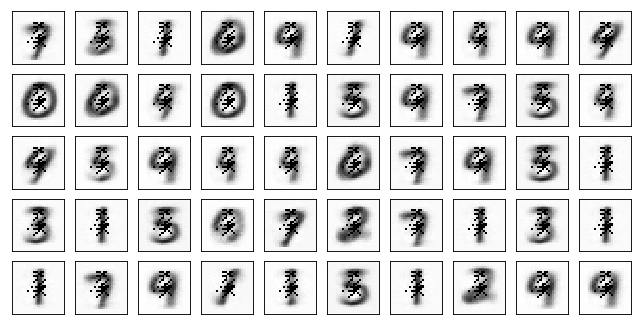

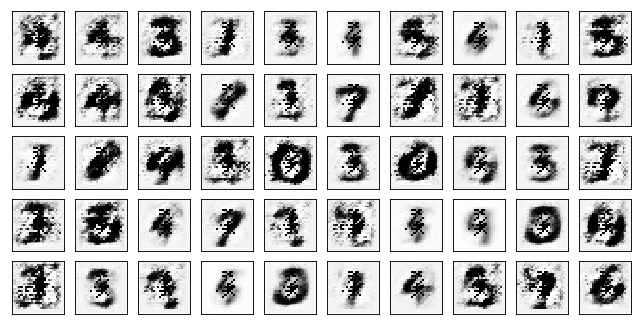

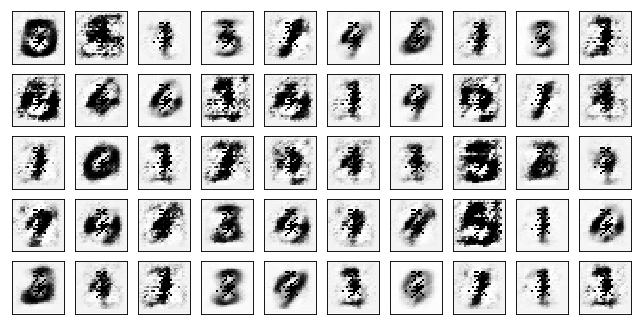

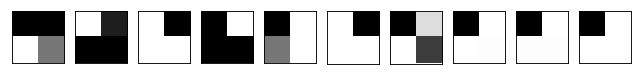

Model Adam Discr+dp:


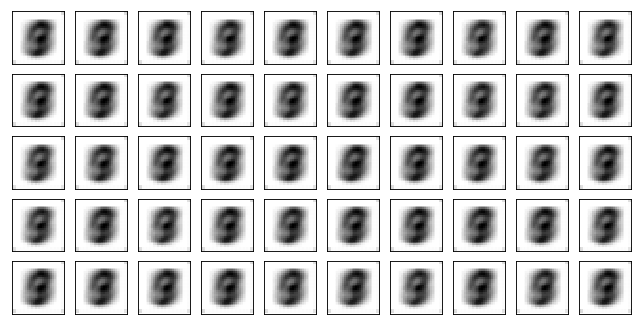

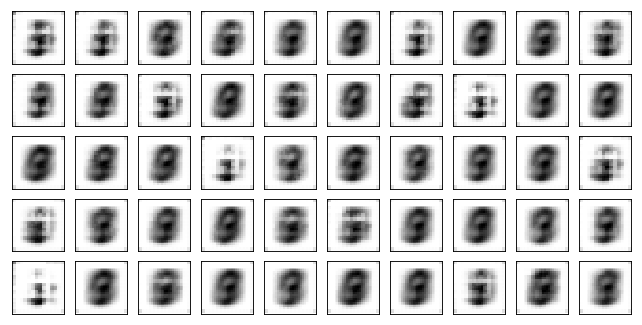

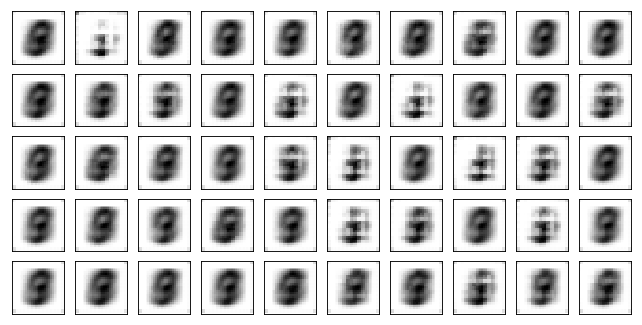

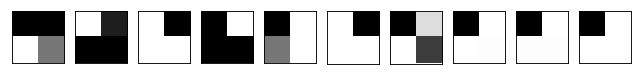

Model Adam Discr+bn+dp:


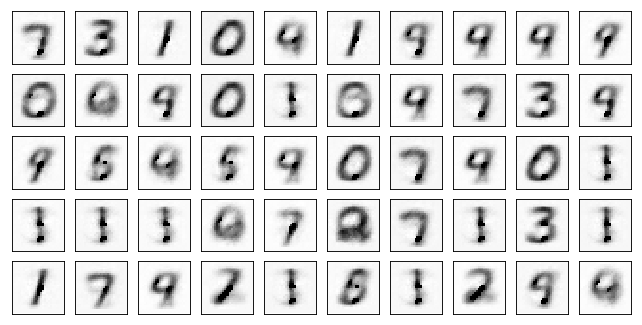

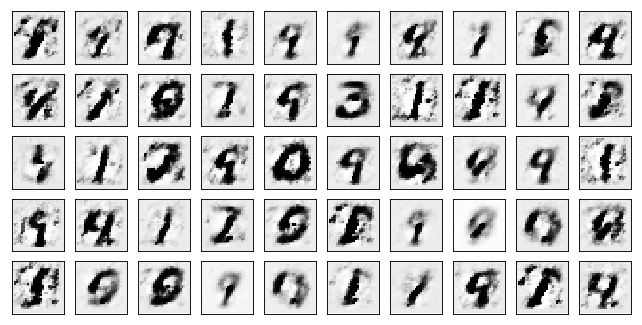

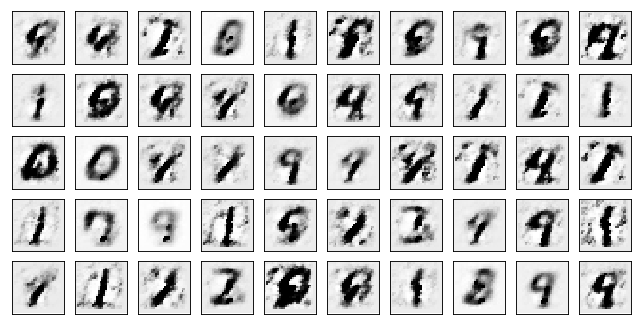

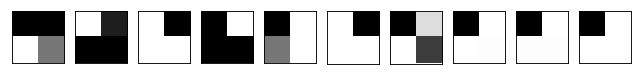

Test losses: 
Adam Discr+bn: 1.43298614 / 1.42017853 / 0.60029180 
Adam Discr+dp: 1.32992196 / 1.50643599 / 0.57826460 
Adam Discr+bn+dp: 1.13106310 / 1.46841383 / 0.67349838 

Train Epoch: 11 [0/50000 (0%)]	Losses Adam Discr+bn: AE:0.5463 D:0.1474 Adam Discr+dp: AE:0.5497 D:0.1684 Adam Discr+bn+dp: AE:0.5121 D:0.1954
Train Epoch: 11 [25000/50000 (50%)]	Losses Adam Discr+bn: AE:0.5838 D:0.2400 Adam Discr+dp: AE:0.5766 D:0.1006 Adam Discr+bn+dp: AE:0.5237 D:0.1694
Train Epoch: 11 [50000/50000 (100%)]	Losses Adam Discr+bn: AE:0.5583 D:0.1053 Adam Discr+dp: AE:0.5475 D:0.1692 Adam Discr+bn+dp: AE:0.4942 D:0.0547
Test losses: 
Adam Discr+bn: 1.41209519 / 1.52010417 / 0.59843742 
Adam Discr+dp: 1.32783914 / 1.64010239 / 0.54593248 
Adam Discr+bn+dp: 1.10443830 / 1.46146989 / 0.63445074 

Train Epoch: 12 [0/50000 (0%)]	Losses Adam Discr+bn: AE:0.5759 D:0.1961 Adam Discr+dp: AE:0.5912 D:0.0852 Adam Discr+bn+dp: AE:0.5083 D:0.1514
Train Epoch: 12 [25000/50000 (50%)]	Losses Adam Discr+bn: AE:0.

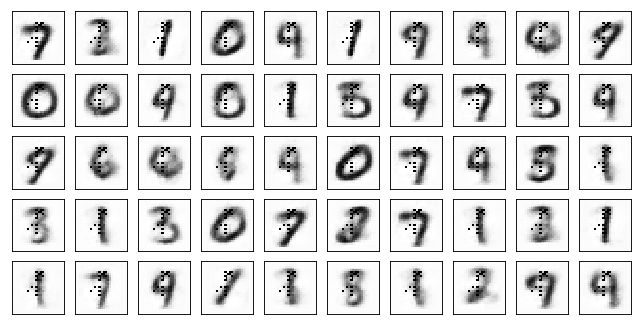

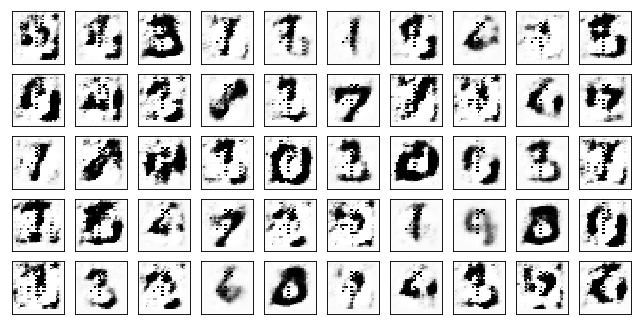

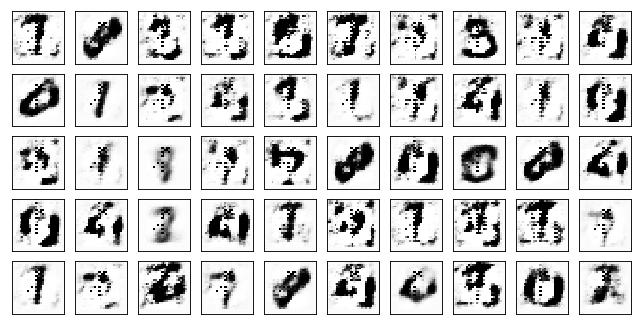

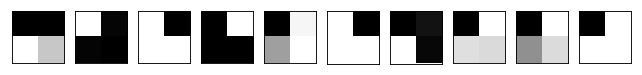

Model Adam Discr+dp:


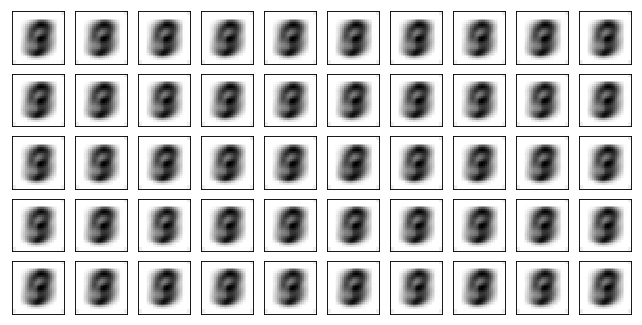

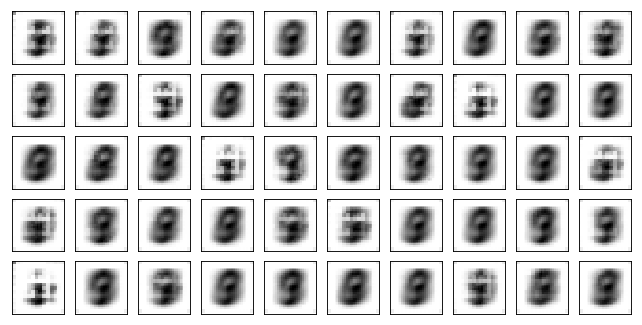

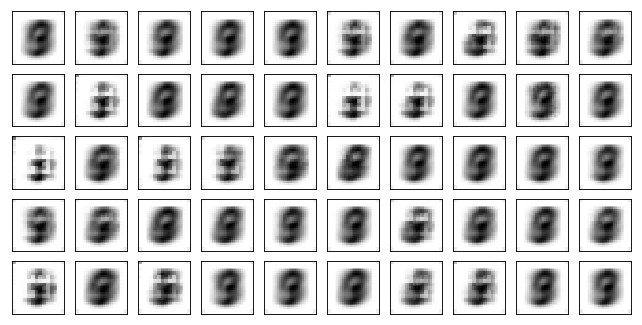

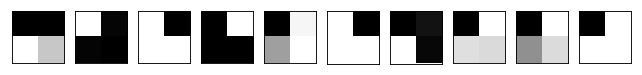

Model Adam Discr+bn+dp:


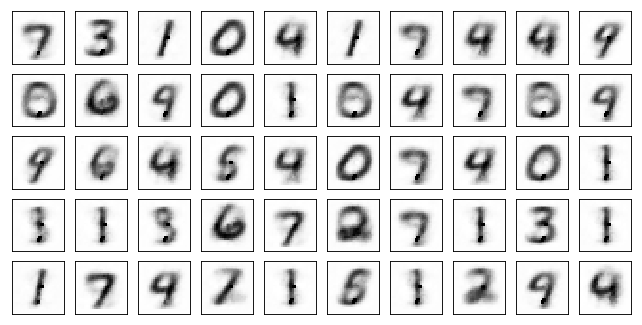

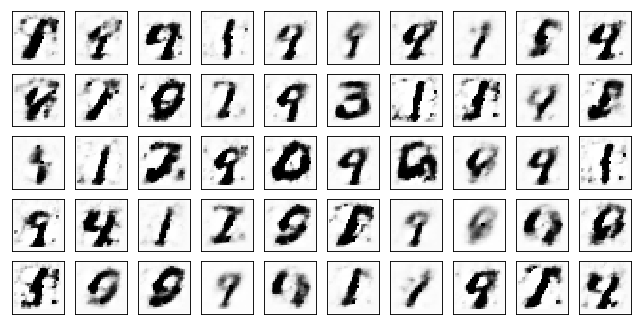

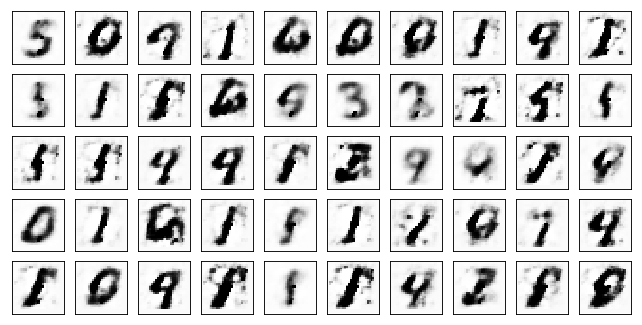

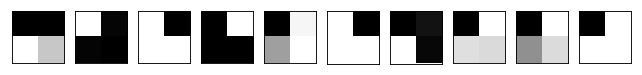

Test losses: 
Adam Discr+bn: 1.02940226 / 1.77639258 / 0.39689997 
Adam Discr+dp: 1.33109415 / 2.07180429 / 0.25496342 
Adam Discr+bn+dp: 0.96211225 / 1.77654588 / 0.40237837 

Train Epoch: 21 [0/50000 (0%)]	Losses Adam Discr+bn: AE:0.5388 D:0.2016 Adam Discr+dp: AE:0.6198 D:0.0809 Adam Discr+bn+dp: AE:0.5351 D:0.1092
Train Epoch: 21 [25000/50000 (50%)]	Losses Adam Discr+bn: AE:0.5296 D:0.0676 Adam Discr+dp: AE:0.6613 D:0.1003 Adam Discr+bn+dp: AE:0.5346 D:0.0714
Train Epoch: 21 [50000/50000 (100%)]	Losses Adam Discr+bn: AE:0.5609 D:0.0576 Adam Discr+dp: AE:0.6885 D:0.0325 Adam Discr+bn+dp: AE:0.5447 D:0.0740
Test losses: 
Adam Discr+bn: 1.02609289 / 1.79210424 / 0.38386175 
Adam Discr+dp: 1.32331049 / 1.94322824 / 0.26320975 
Adam Discr+bn+dp: 0.93628073 / 1.79342067 / 0.39401397 

Train Epoch: 22 [0/50000 (0%)]	Losses Adam Discr+bn: AE:0.5550 D:0.1242 Adam Discr+dp: AE:0.6409 D:0.0447 Adam Discr+bn+dp: AE:0.5264 D:0.0512
Train Epoch: 22 [25000/50000 (50%)]	Losses Adam Discr+bn: AE:0.

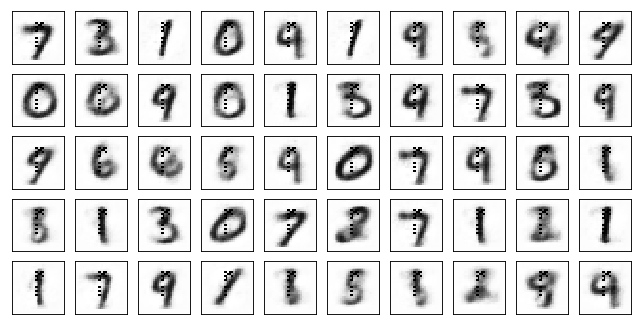

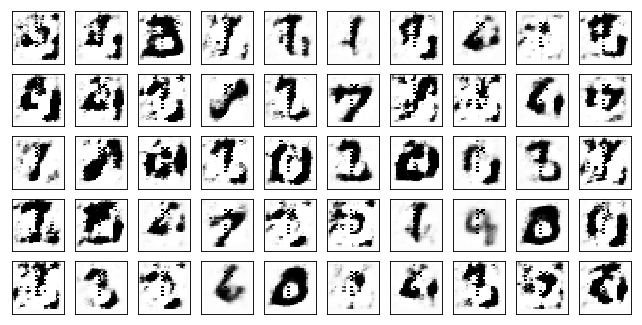

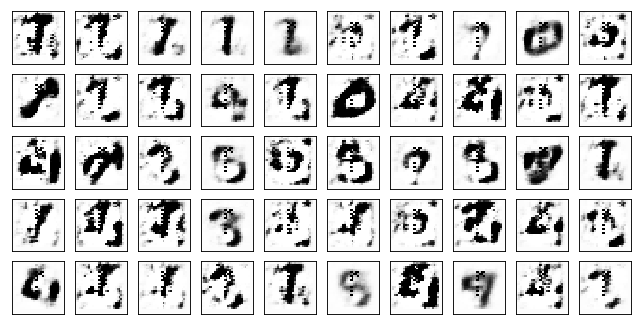

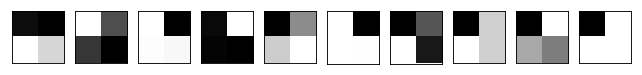

Model Adam Discr+dp:


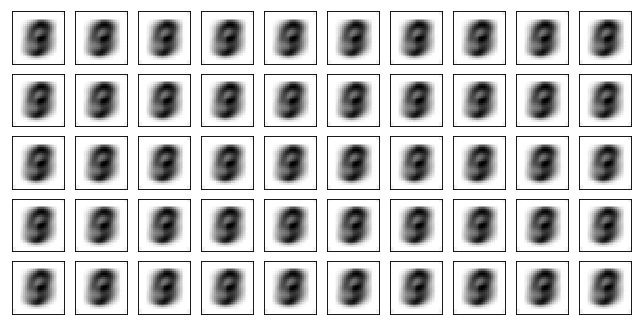

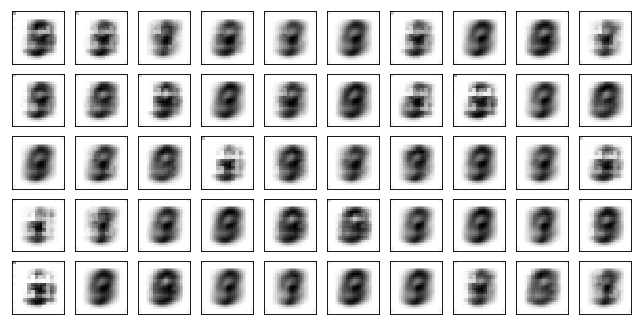

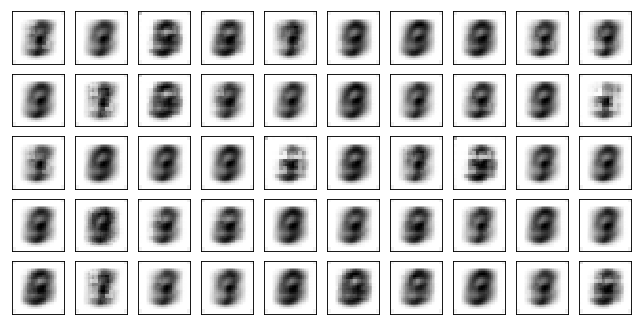

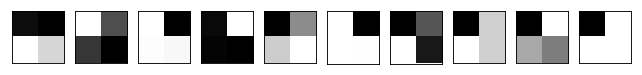

Model Adam Discr+bn+dp:


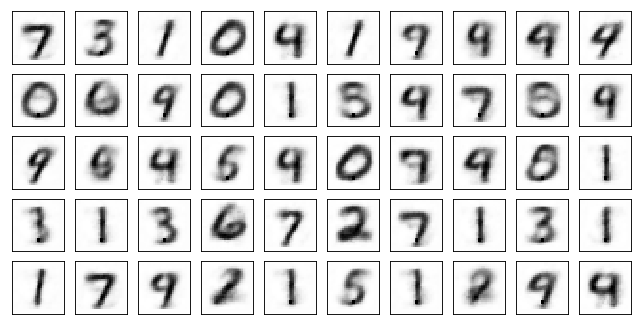

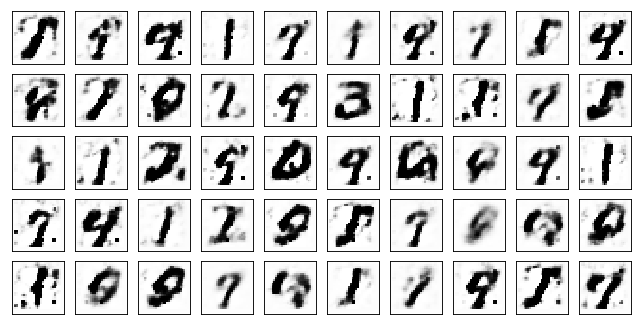

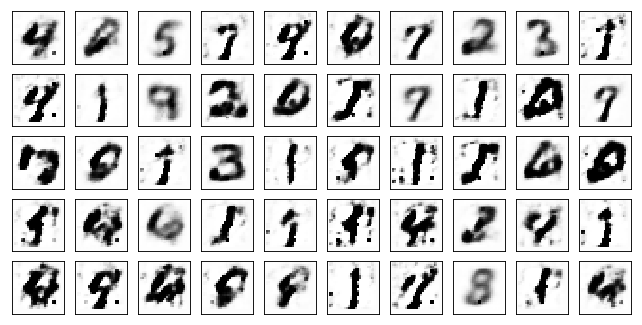

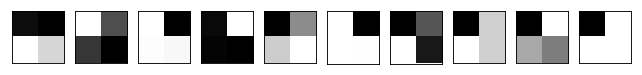

Test losses: 
Adam Discr+bn: 0.96031338 / 1.87854040 / 0.34218735 
Adam Discr+dp: 1.34196925 / 1.70653749 / 0.34676488 
Adam Discr+bn+dp: 0.85721153 / 1.90249538 / 0.34424710 

Train Epoch: 31 [0/50000 (0%)]	Losses Adam Discr+bn: AE:0.5448 D:0.1550 Adam Discr+dp: AE:0.6129 D:0.1185 Adam Discr+bn+dp: AE:0.5278 D:0.0745
Train Epoch: 31 [25000/50000 (50%)]	Losses Adam Discr+bn: AE:0.5343 D:0.0849 Adam Discr+dp: AE:0.5951 D:0.0714 Adam Discr+bn+dp: AE:0.5271 D:0.0880
Train Epoch: 31 [50000/50000 (100%)]	Losses Adam Discr+bn: AE:0.5680 D:0.0872 Adam Discr+dp: AE:0.6336 D:0.1306 Adam Discr+bn+dp: AE:0.5294 D:0.0659
Test losses: 
Adam Discr+bn: 0.95824170 / 1.89661252 / 0.31969067 
Adam Discr+dp: 1.33623970 / 1.88786113 / 0.32266441 
Adam Discr+bn+dp: 0.84992003 / 1.84961987 / 0.34755726 

Train Epoch: 32 [0/50000 (0%)]	Losses Adam Discr+bn: AE:0.5525 D:0.0822 Adam Discr+dp: AE:0.6534 D:0.0937 Adam Discr+bn+dp: AE:0.5216 D:0.0354
Train Epoch: 32 [25000/50000 (50%)]	Losses Adam Discr+bn: AE:0.

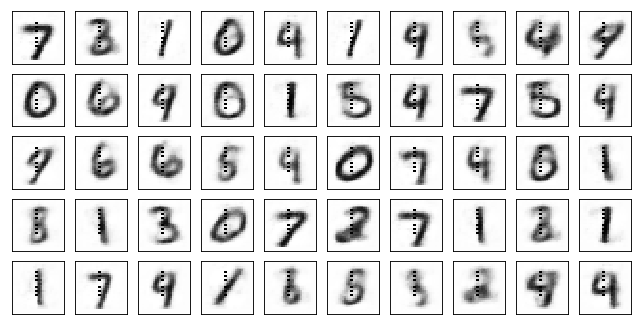

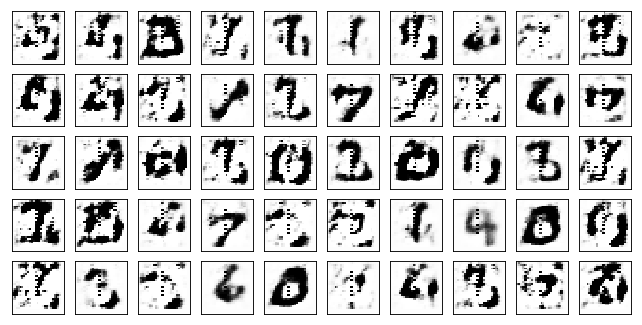

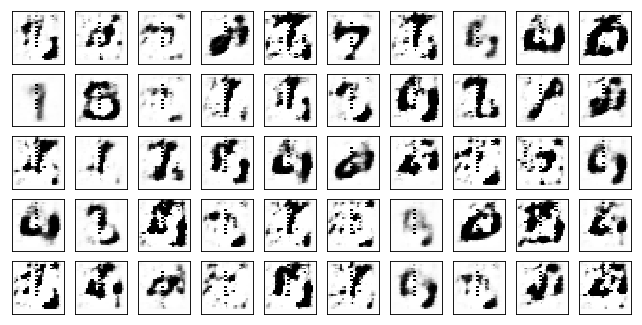

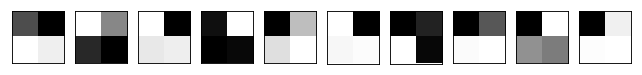

Model Adam Discr+dp:


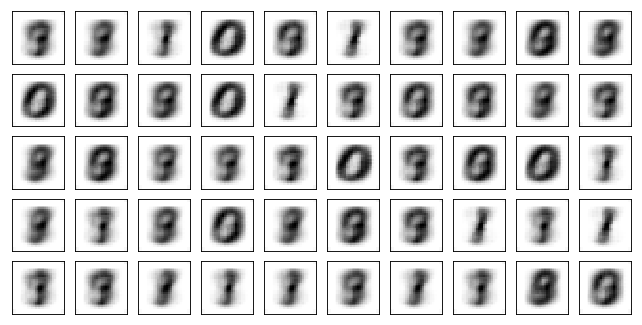

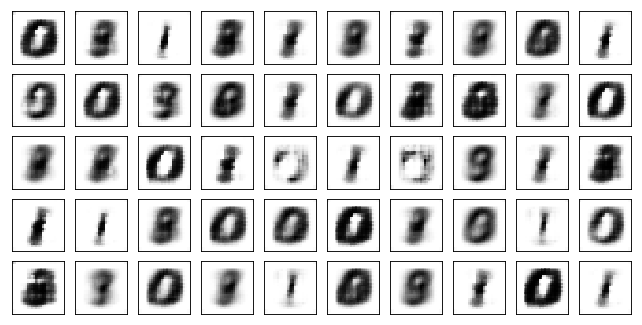

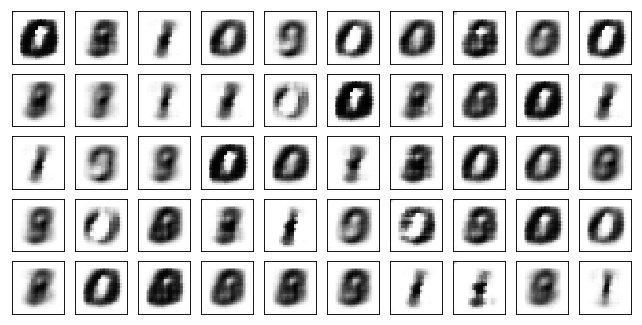

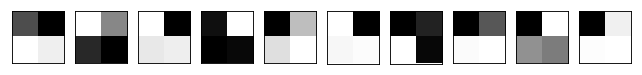

Model Adam Discr+bn+dp:


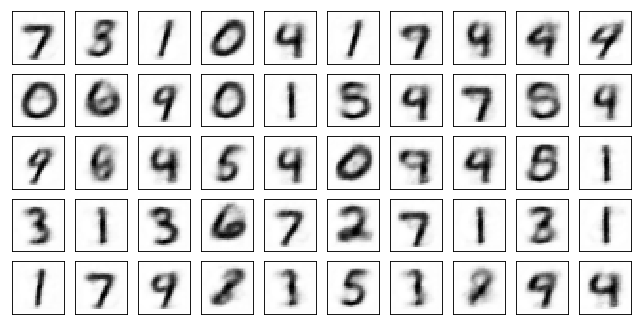

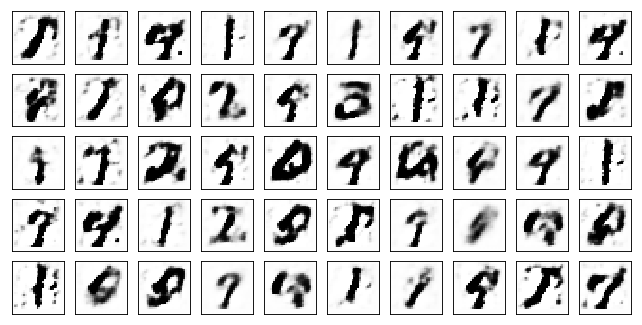

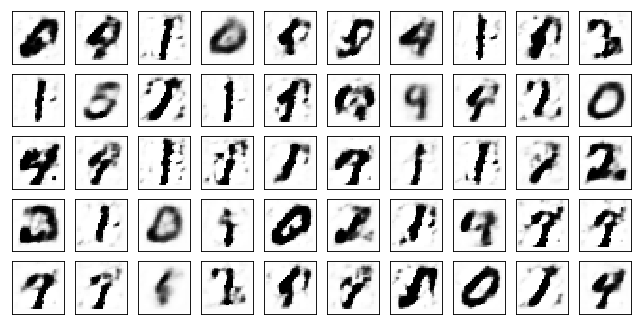

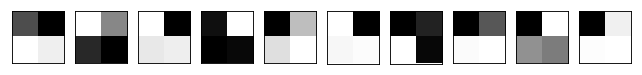

Test losses: 
Adam Discr+bn: 0.88829124 / 1.96726298 / 0.30697379 
Adam Discr+dp: 1.16297090 / 1.98682475 / 0.30127929 
Adam Discr+bn+dp: 0.80857694 / 1.90778577 / 0.31841647 

Train Epoch: 41 [0/50000 (0%)]	Losses Adam Discr+bn: AE:0.5753 D:0.0200 Adam Discr+dp: AE:0.6304 D:0.0607 Adam Discr+bn+dp: AE:0.5579 D:0.1043
Train Epoch: 41 [25000/50000 (50%)]	Losses Adam Discr+bn: AE:0.5589 D:0.0701 Adam Discr+dp: AE:0.6395 D:0.0827 Adam Discr+bn+dp: AE:0.5555 D:0.0259
Train Epoch: 41 [50000/50000 (100%)]	Losses Adam Discr+bn: AE:0.5574 D:0.0813 Adam Discr+dp: AE:0.6337 D:0.1011 Adam Discr+bn+dp: AE:0.5598 D:0.0715
Test losses: 
Adam Discr+bn: 0.87660629 / 1.97778428 / 0.29660047 
Adam Discr+dp: 1.15586305 / 1.92522788 / 0.31511541 
Adam Discr+bn+dp: 0.80363464 / 1.98505998 / 0.31802576 

Train Epoch: 42 [0/50000 (0%)]	Losses Adam Discr+bn: AE:0.5375 D:0.0153 Adam Discr+dp: AE:0.6022 D:0.0152 Adam Discr+bn+dp: AE:0.5558 D:0.0145
Train Epoch: 42 [25000/50000 (50%)]	Losses Adam Discr+bn: AE:0.

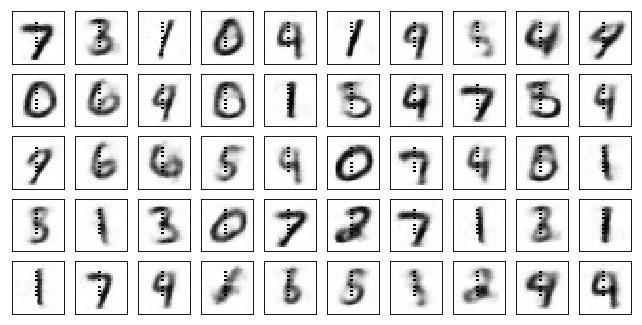

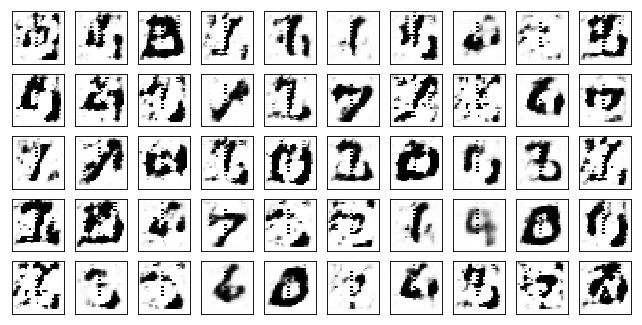

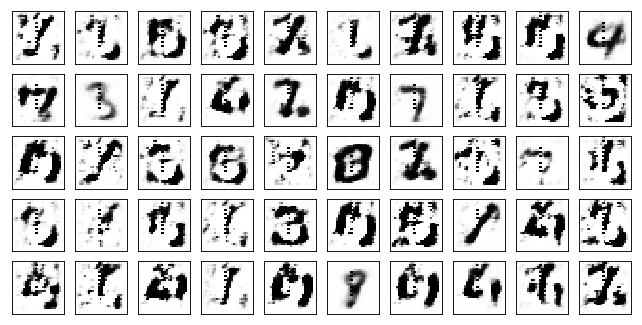

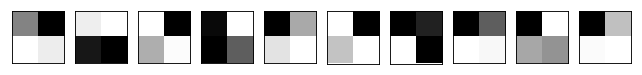

Model Adam Discr+dp:


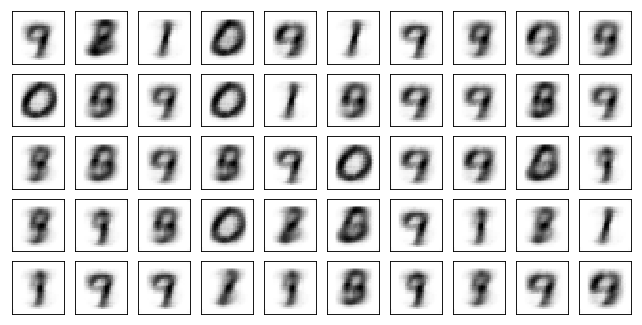

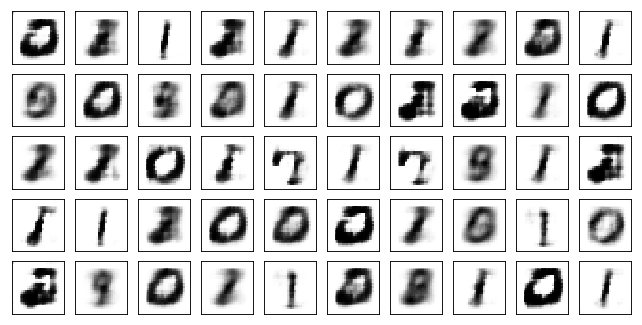

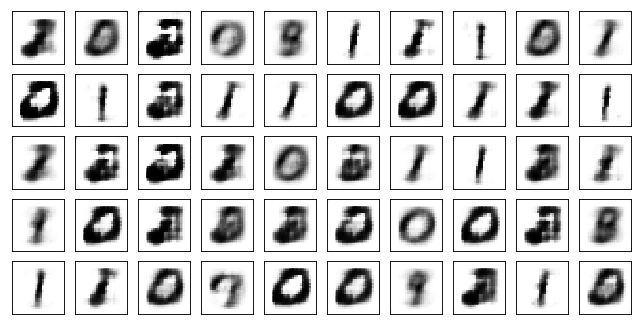

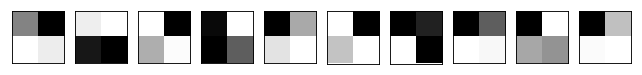

Model Adam Discr+bn+dp:


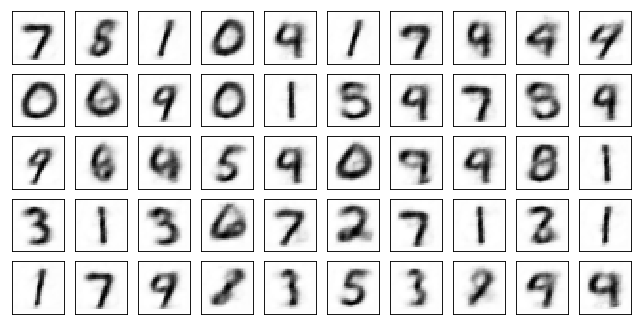

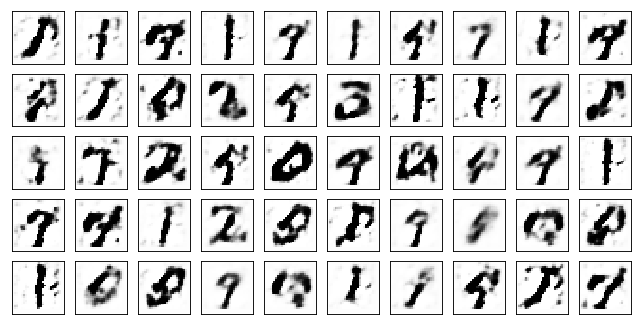

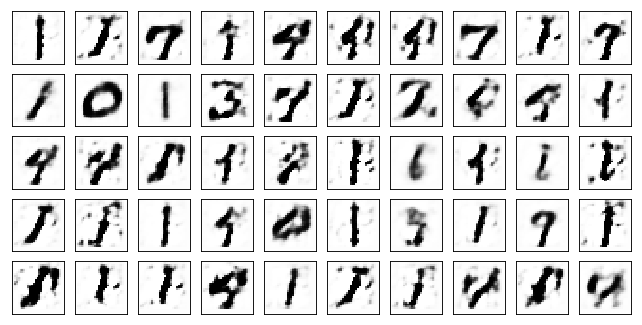

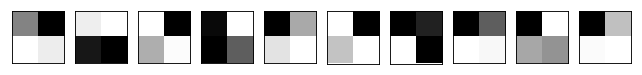

Test losses: 
Adam Discr+bn: 0.87053549 / 2.01815033 / 0.28258175 
Adam Discr+dp: 1.08840489 / 1.89923000 / 0.29781843 
Adam Discr+bn+dp: 0.78743750 / 1.95799446 / 0.29020108 

Train Epoch: 51 [0/50000 (0%)]	Losses Adam Discr+bn: AE:0.5532 D:0.0471 Adam Discr+dp: AE:0.5932 D:0.0191 Adam Discr+bn+dp: AE:0.5308 D:0.0635
Train Epoch: 51 [25000/50000 (50%)]	Losses Adam Discr+bn: AE:0.5622 D:0.0532 Adam Discr+dp: AE:0.6193 D:0.0568 Adam Discr+bn+dp: AE:0.5828 D:0.0758
Train Epoch: 51 [50000/50000 (100%)]	Losses Adam Discr+bn: AE:0.5625 D:0.0486 Adam Discr+dp: AE:0.5838 D:0.0528 Adam Discr+bn+dp: AE:0.5654 D:0.0600
Test losses: 
Adam Discr+bn: 0.85867554 / 2.03181243 / 0.27061263 
Adam Discr+dp: 1.08012128 / 1.86191356 / 0.29248612 
Adam Discr+bn+dp: 0.79041684 / 2.04555988 / 0.30354943 

Train Epoch: 52 [0/50000 (0%)]	Losses Adam Discr+bn: AE:0.5532 D:0.0681 Adam Discr+dp: AE:0.6047 D:0.0565 Adam Discr+bn+dp: AE:0.5477 D:0.0716
Train Epoch: 52 [25000/50000 (50%)]	Losses Adam Discr+bn: AE:0.

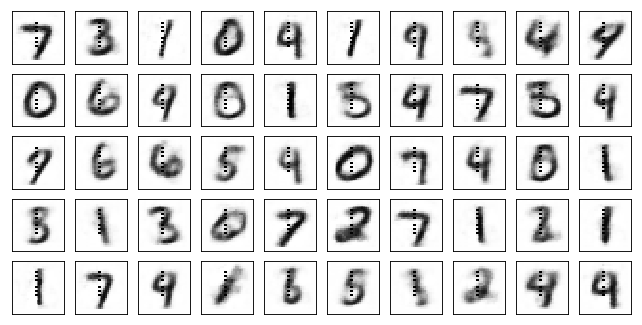

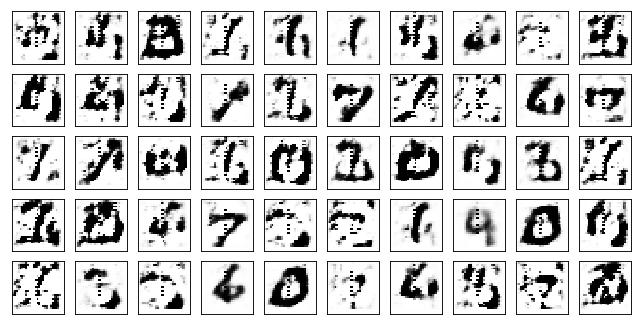

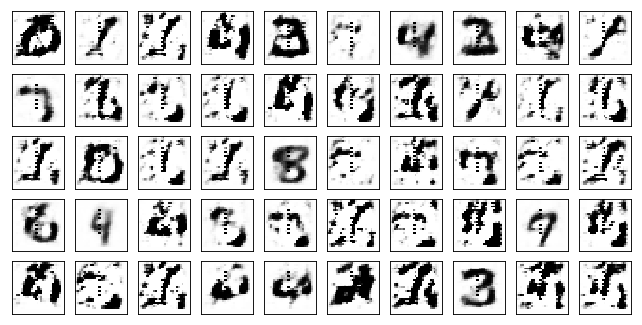

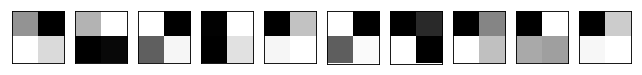

Model Adam Discr+dp:


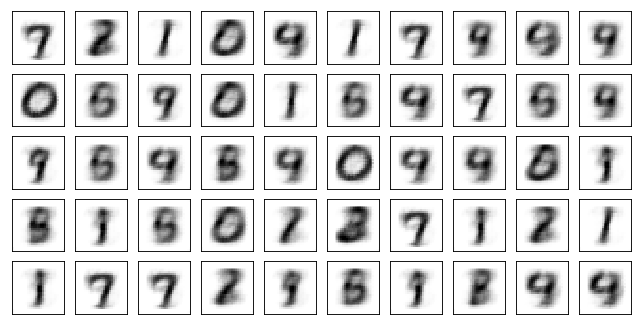

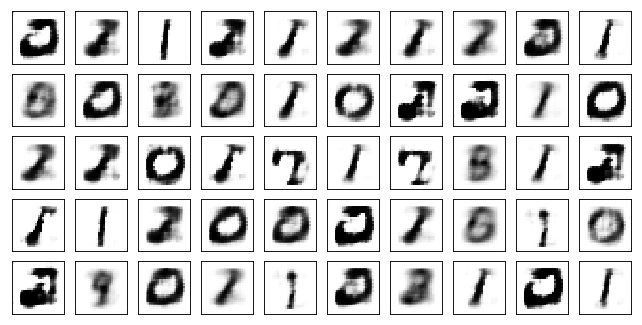

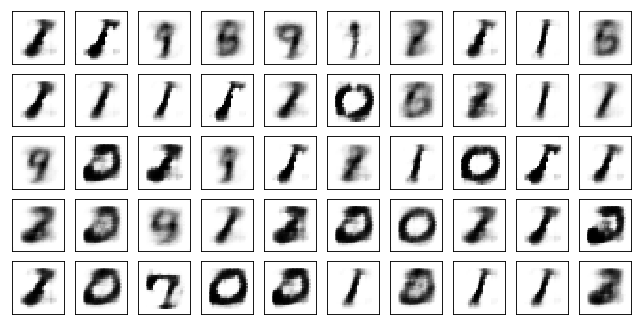

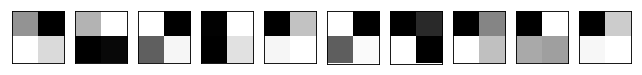

Model Adam Discr+bn+dp:


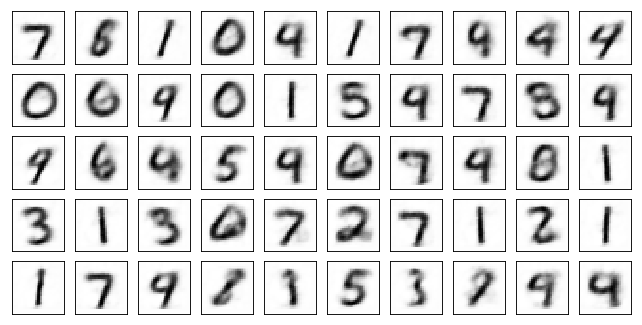

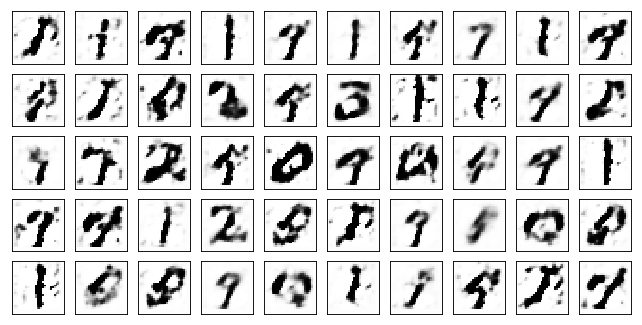

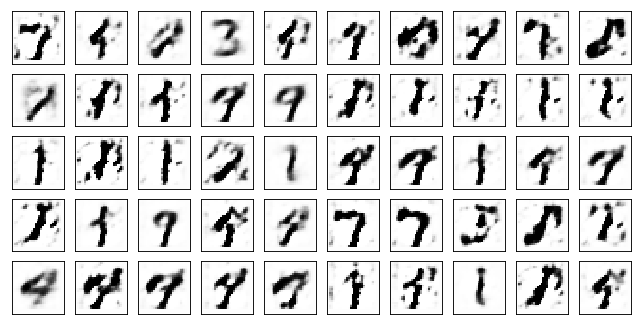

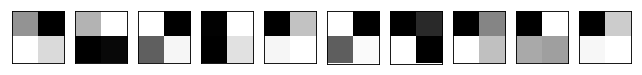

Test losses: 
Adam Discr+bn: 0.84912872 / 2.03712964 / 0.27312978 
Adam Discr+dp: 1.04339838 / 1.90752006 / 0.28202904 
Adam Discr+bn+dp: 0.77882272 / 1.94871259 / 0.28755704 

Train Epoch: 61 [0/50000 (0%)]	Losses Adam Discr+bn: AE:0.5562 D:0.0156 Adam Discr+dp: AE:0.5696 D:0.1477 Adam Discr+bn+dp: AE:0.5491 D:0.1222
Train Epoch: 61 [25000/50000 (50%)]	Losses Adam Discr+bn: AE:0.5693 D:0.0732 Adam Discr+dp: AE:0.5977 D:0.0823 Adam Discr+bn+dp: AE:0.5538 D:0.0610
Train Epoch: 61 [50000/50000 (100%)]	Losses Adam Discr+bn: AE:0.5793 D:0.0607 Adam Discr+dp: AE:0.6259 D:0.0427 Adam Discr+bn+dp: AE:0.5686 D:0.0467
Test losses: 
Adam Discr+bn: 0.84994614 / 2.05012751 / 0.27171176 
Adam Discr+dp: 1.03790271 / 2.02205706 / 0.28345653 
Adam Discr+bn+dp: 0.77732819 / 1.97625518 / 0.28602403 

Train Epoch: 62 [0/50000 (0%)]	Losses Adam Discr+bn: AE:0.5603 D:0.0123 Adam Discr+dp: AE:0.6439 D:0.0954 Adam Discr+bn+dp: AE:0.5502 D:0.0156
Train Epoch: 62 [25000/50000 (50%)]	Losses Adam Discr+bn: AE:0.

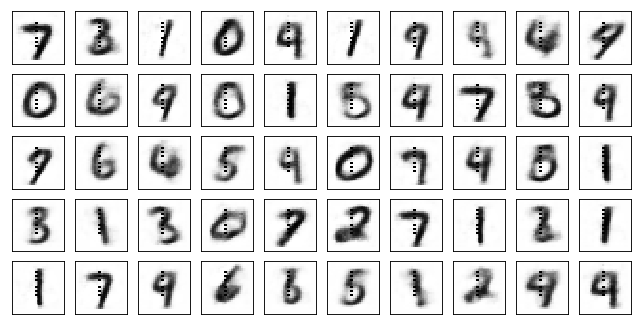

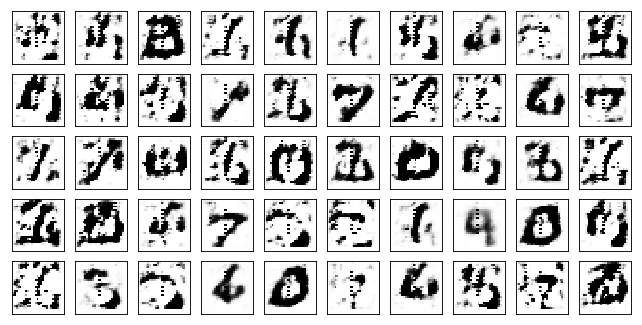

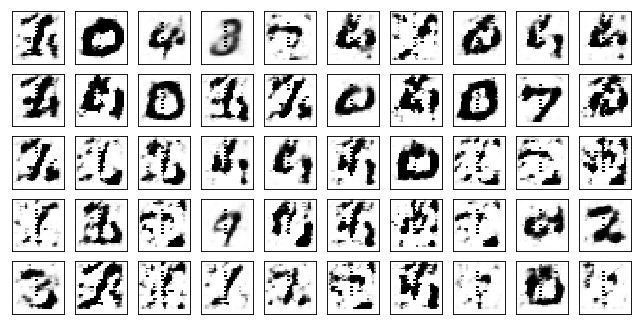

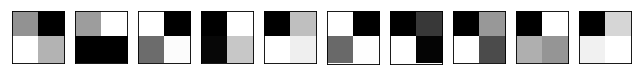

Model Adam Discr+dp:


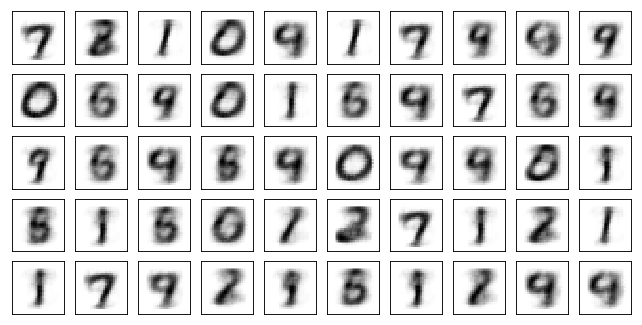

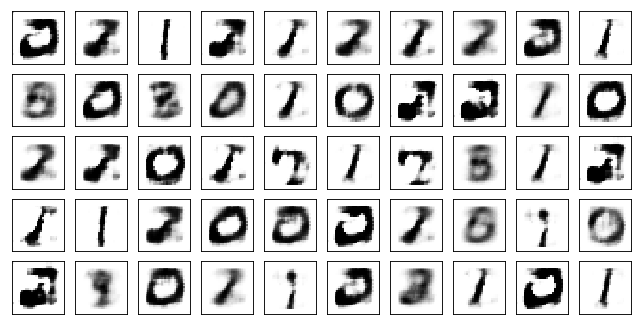

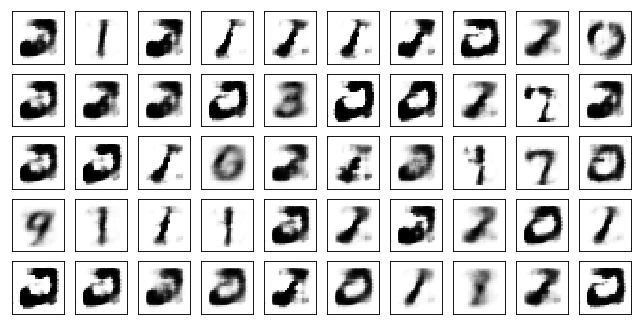

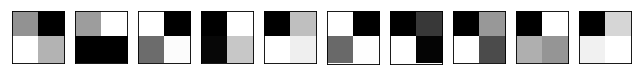

Model Adam Discr+bn+dp:


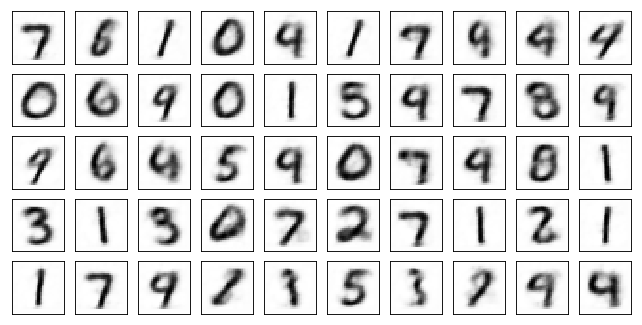

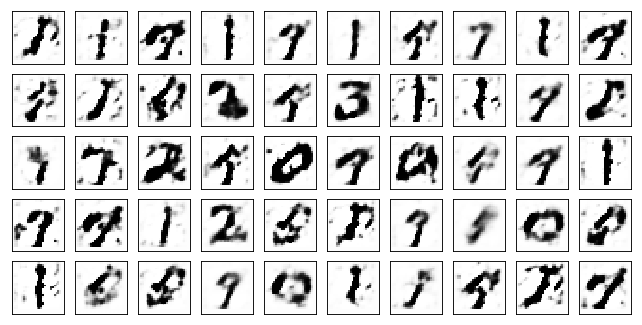

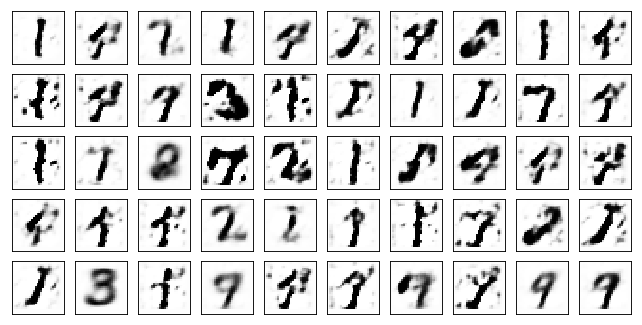

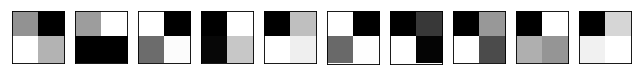

Test losses: 
Adam Discr+bn: 0.84067971 / 2.01587486 / 0.26689891 
Adam Discr+dp: 0.99599338 / 1.95916855 / 0.27332776 
Adam Discr+bn+dp: 0.76937091 / 1.97662604 / 0.27976707 

Train Epoch: 71 [0/50000 (0%)]	Losses Adam Discr+bn: AE:0.5507 D:0.0113 Adam Discr+dp: AE:0.6272 D:0.0911 Adam Discr+bn+dp: AE:0.5617 D:0.1371
Train Epoch: 71 [25000/50000 (50%)]	Losses Adam Discr+bn: AE:0.5399 D:0.0174 Adam Discr+dp: AE:0.5987 D:0.0546 Adam Discr+bn+dp: AE:0.5738 D:0.0113
Train Epoch: 71 [50000/50000 (100%)]	Losses Adam Discr+bn: AE:0.5540 D:0.0800 Adam Discr+dp: AE:0.5952 D:0.0524 Adam Discr+bn+dp: AE:0.5490 D:0.1068
Test losses: 
Adam Discr+bn: 0.83280271 / 2.01793671 / 0.26396707 
Adam Discr+dp: 0.98869205 / 1.97300196 / 0.27236732 
Adam Discr+bn+dp: 0.76955223 / 1.96781719 / 0.27941057 

Train Epoch: 72 [0/50000 (0%)]	Losses Adam Discr+bn: AE:0.5549 D:0.0753 Adam Discr+dp: AE:0.6210 D:0.0618 Adam Discr+bn+dp: AE:0.5519 D:0.0241
Train Epoch: 72 [25000/50000 (50%)]	Losses Adam Discr+bn: AE:0.

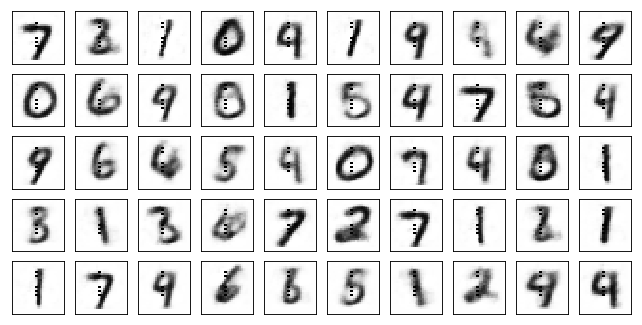

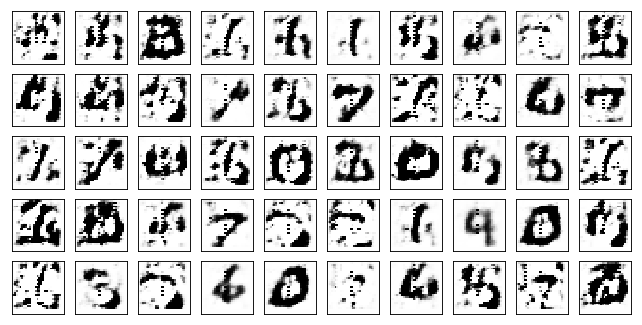

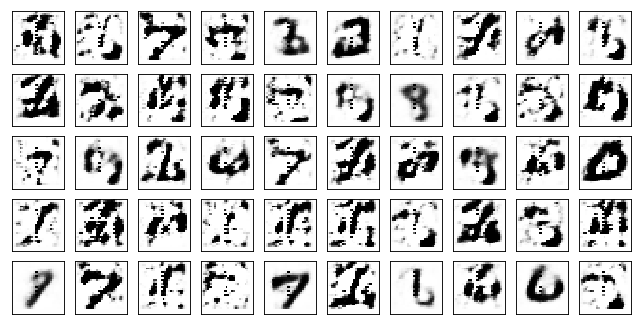

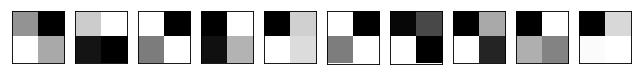

Model Adam Discr+dp:


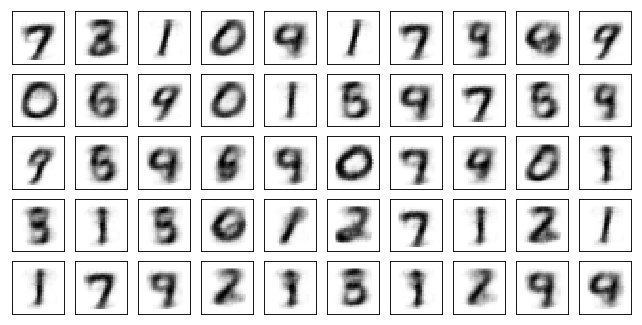

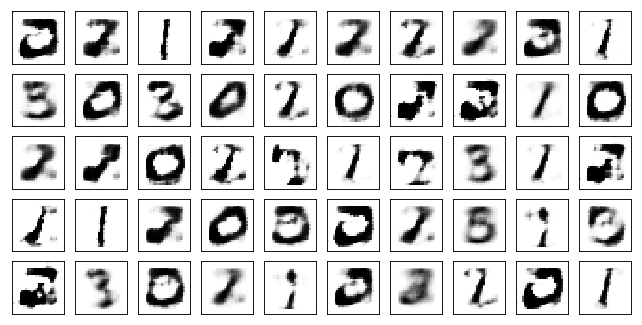

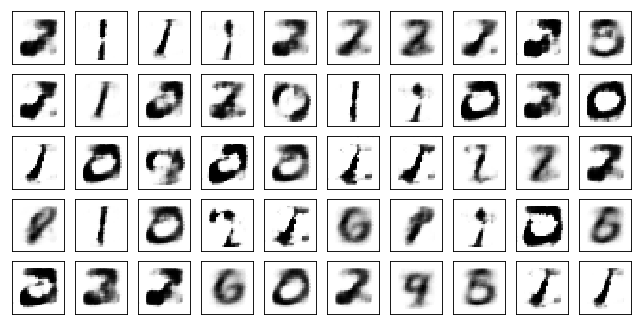

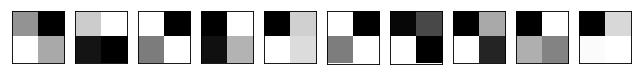

Model Adam Discr+bn+dp:


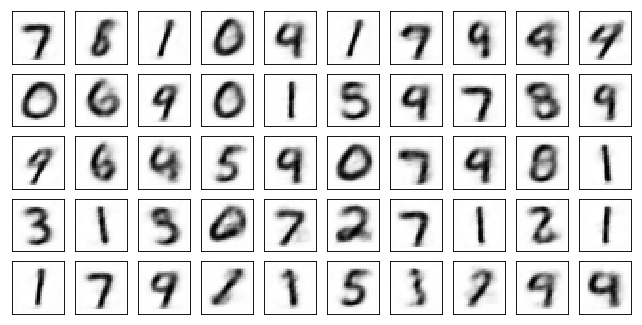

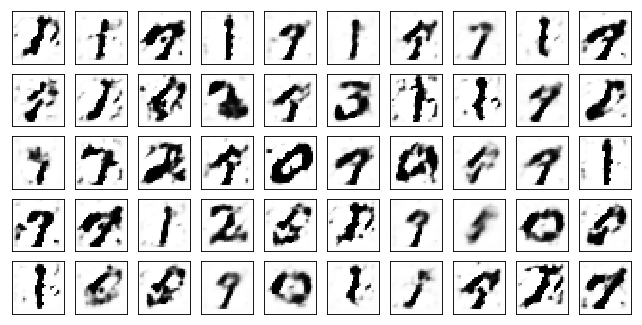

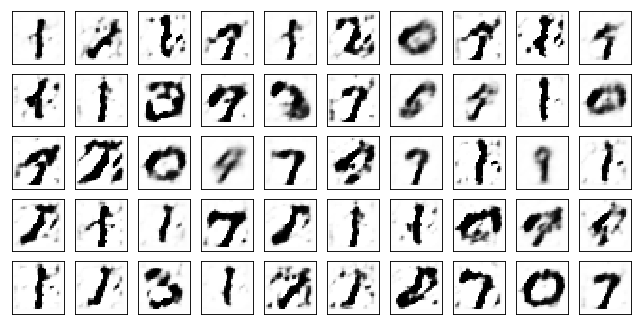

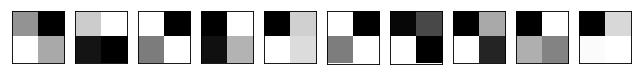

Test losses: 
Adam Discr+bn: 0.79808509 / 2.09626460 / 0.26515120 
Adam Discr+dp: 0.91367733 / 2.05301738 / 0.26550820 
Adam Discr+bn+dp: 0.76243961 / 1.98063219 / 0.25510286 

Train Epoch: 81 [0/50000 (0%)]	Losses Adam Discr+bn: AE:0.5693 D:0.0904 Adam Discr+dp: AE:0.6130 D:0.0164 Adam Discr+bn+dp: AE:0.5451 D:0.0670
Train Epoch: 81 [25000/50000 (50%)]	Losses Adam Discr+bn: AE:0.5468 D:0.0582 Adam Discr+dp: AE:0.6157 D:0.0488 Adam Discr+bn+dp: AE:0.5642 D:0.0122
Train Epoch: 81 [50000/50000 (100%)]	Losses Adam Discr+bn: AE:0.5546 D:0.0182 Adam Discr+dp: AE:0.5650 D:0.0138 Adam Discr+bn+dp: AE:0.5494 D:0.0193
Test losses: 
Adam Discr+bn: 0.79871273 / 2.06764317 / 0.25866172 
Adam Discr+dp: 0.90134710 / 2.01059651 / 0.26250230 
Adam Discr+bn+dp: 0.76265424 / 2.05066299 / 0.25299395 

Train Epoch: 82 [0/50000 (0%)]	Losses Adam Discr+bn: AE:0.5185 D:0.0624 Adam Discr+dp: AE:0.5541 D:0.0641 Adam Discr+bn+dp: AE:0.5462 D:0.0561
Train Epoch: 82 [25000/50000 (50%)]	Losses Adam Discr+bn: AE:0.

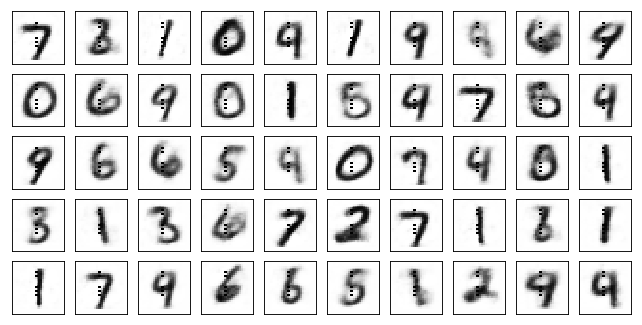

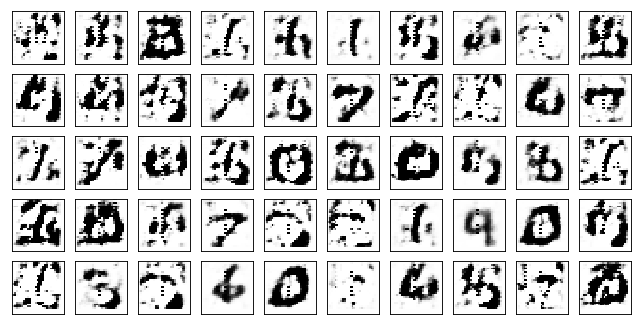

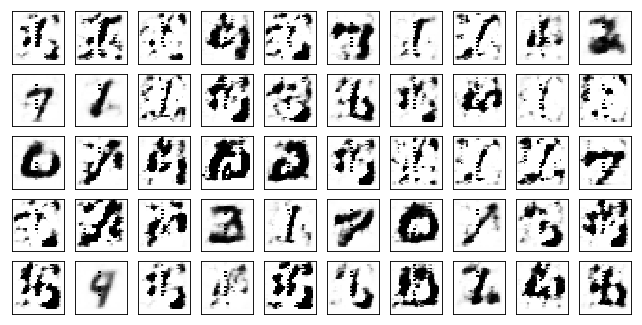

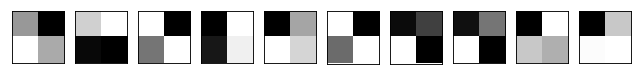

Model Adam Discr+dp:


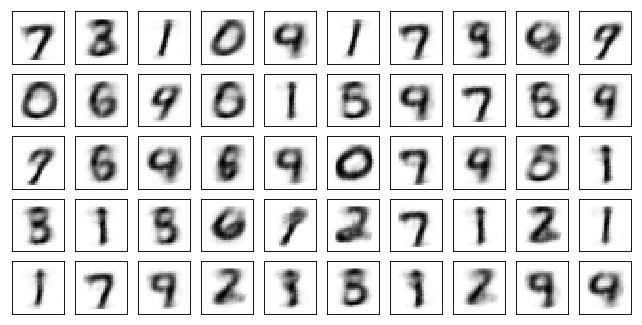

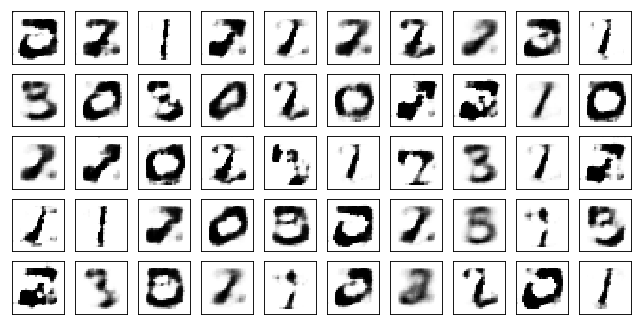

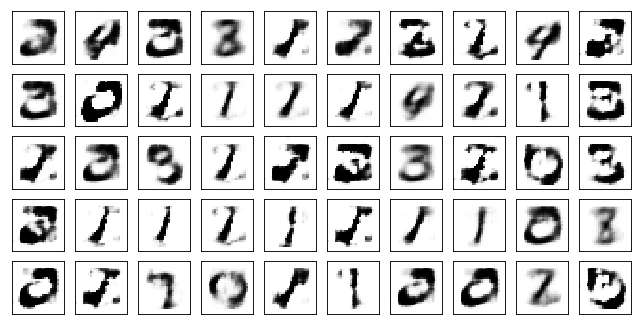

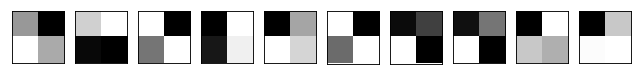

Model Adam Discr+bn+dp:


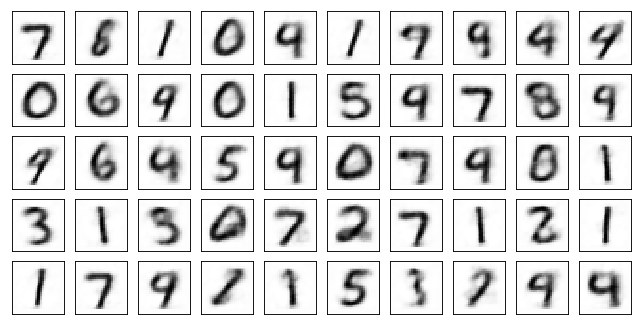

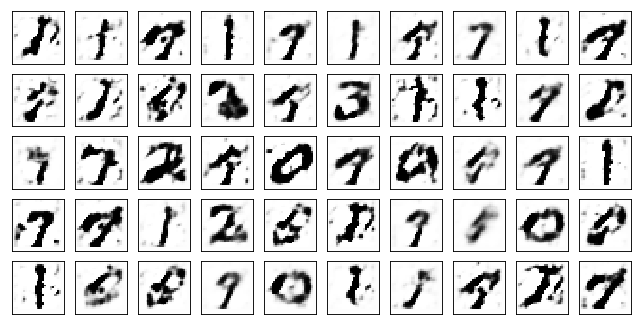

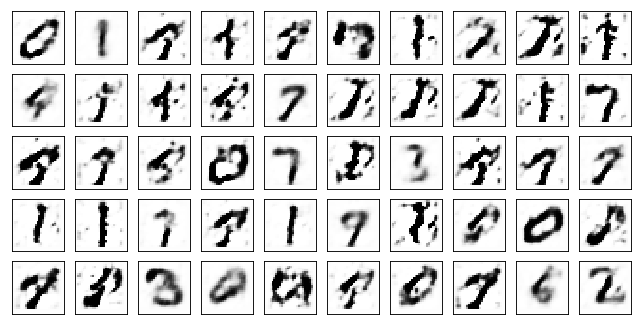

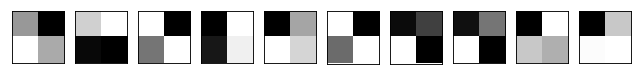

Test losses: 
Adam Discr+bn: 0.79385984 / 2.11102557 / 0.25935653 
Adam Discr+dp: 0.87347865 / 1.95777202 / 0.25087863 
Adam Discr+bn+dp: 0.75718433 / 2.10799336 / 0.25303524 

Train Epoch: 91 [0/50000 (0%)]	Losses Adam Discr+bn: AE:0.5836 D:0.0451 Adam Discr+dp: AE:0.5749 D:0.0609 Adam Discr+bn+dp: AE:0.5637 D:0.0165
Train Epoch: 91 [25000/50000 (50%)]	Losses Adam Discr+bn: AE:0.5503 D:0.0512 Adam Discr+dp: AE:0.6012 D:0.1565 Adam Discr+bn+dp: AE:0.5906 D:0.1448
Train Epoch: 91 [50000/50000 (100%)]	Losses Adam Discr+bn: AE:0.5648 D:0.0586 Adam Discr+dp: AE:0.5759 D:0.0154 Adam Discr+bn+dp: AE:0.6058 D:0.0124
Test losses: 
Adam Discr+bn: 0.79102349 / 2.15682530 / 0.27090543 
Adam Discr+dp: 0.87383282 / 2.00742984 / 0.24763827 
Adam Discr+bn+dp: 0.75586808 / 2.10444164 / 0.26872843 

Train Epoch: 92 [0/50000 (0%)]	Losses Adam Discr+bn: AE:0.5866 D:0.0563 Adam Discr+dp: AE:0.5809 D:0.0491 Adam Discr+bn+dp: AE:0.5596 D:0.0728
Train Epoch: 92 [25000/50000 (50%)]	Losses Adam Discr+bn: AE:0.

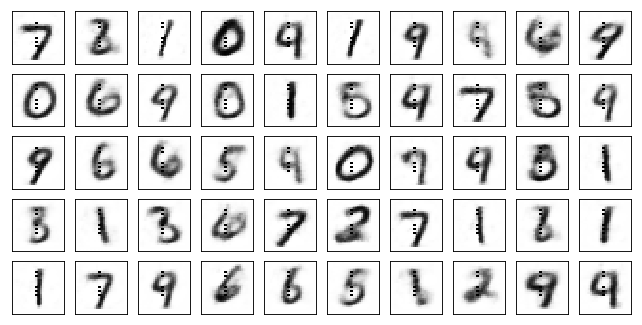

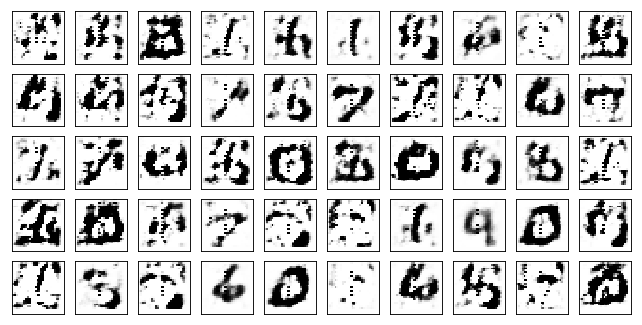

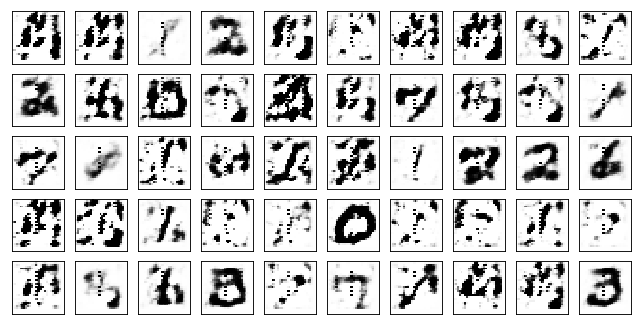

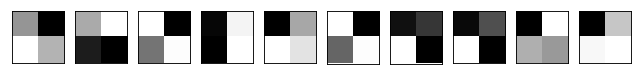

Model Adam Discr+dp:


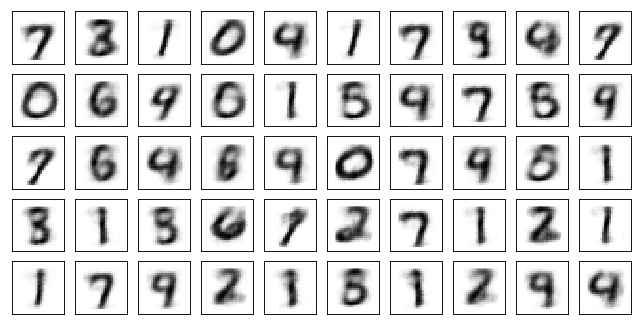

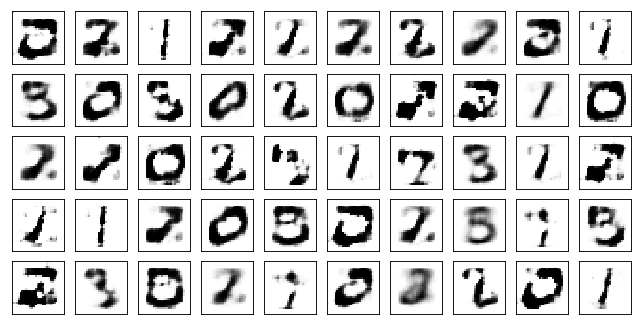

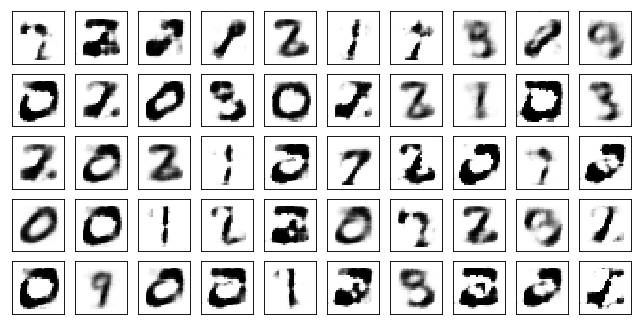

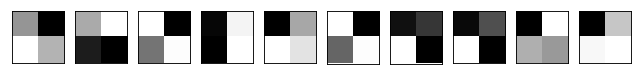

Model Adam Discr+bn+dp:


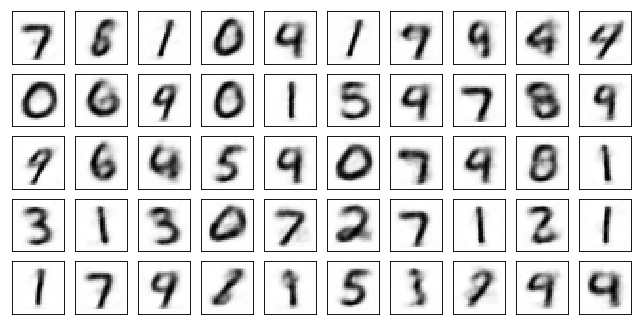

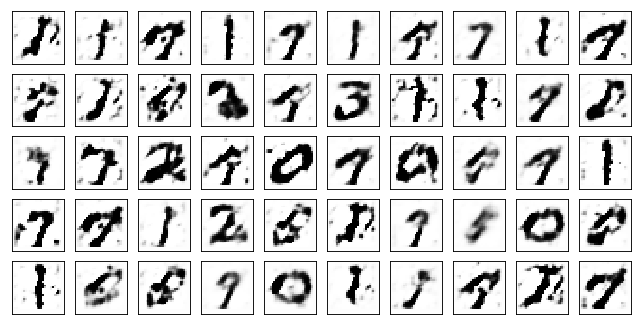

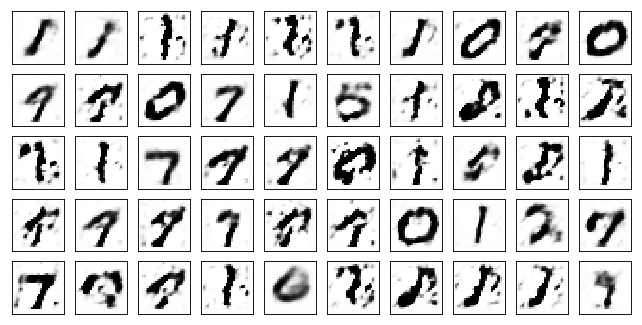

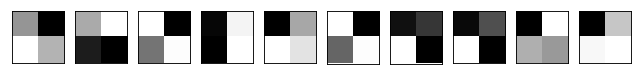

Test losses: 
Adam Discr+bn: 0.78289664 / 2.09288931 / 0.24613988 
Adam Discr+dp: 0.86106849 / 2.01190972 / 0.24856401 
Adam Discr+bn+dp: 0.74943852 / 2.16065884 / 0.26506176 

Train Epoch: 101 [0/50000 (0%)]	Losses Adam Discr+bn: AE:0.5520 D:0.1010 Adam Discr+dp: AE:0.5789 D:0.0143 Adam Discr+bn+dp: AE:0.5738 D:0.0550
Train Epoch: 101 [25000/50000 (50%)]	Losses Adam Discr+bn: AE:0.5500 D:0.0155 Adam Discr+dp: AE:0.5833 D:0.0706 Adam Discr+bn+dp: AE:0.5444 D:0.0531
Train Epoch: 101 [50000/50000 (100%)]	Losses Adam Discr+bn: AE:0.5732 D:0.0125 Adam Discr+dp: AE:0.5845 D:0.0134 Adam Discr+bn+dp: AE:0.5824 D:0.0106
Test losses: 
Adam Discr+bn: 0.78198087 / 2.13205552 / 0.25730540 
Adam Discr+dp: 0.85434848 / 2.05701065 / 0.25632545 
Adam Discr+bn+dp: 0.74842995 / 2.19027710 / 0.26139609 

Train Epoch: 102 [0/50000 (0%)]	Losses Adam Discr+bn: AE:0.5748 D:0.1337 Adam Discr+dp: AE:0.6028 D:0.0651 Adam Discr+bn+dp: AE:0.5992 D:0.0253
Train Epoch: 102 [25000/50000 (50%)]	Losses Adam Discr+bn: 

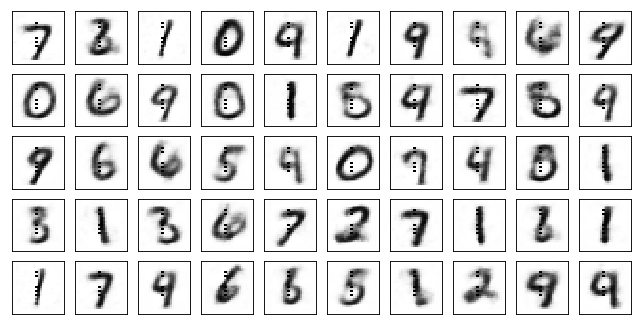

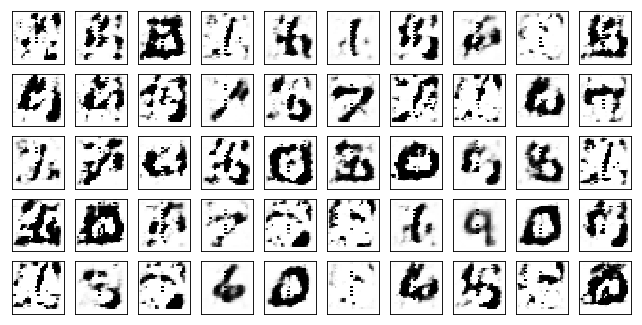

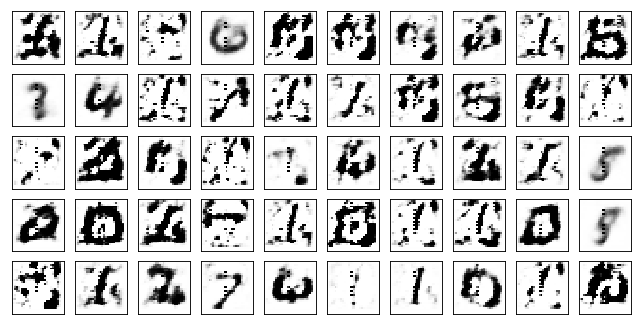

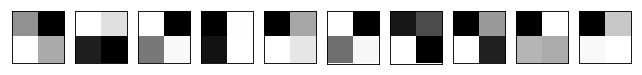

Model Adam Discr+dp:


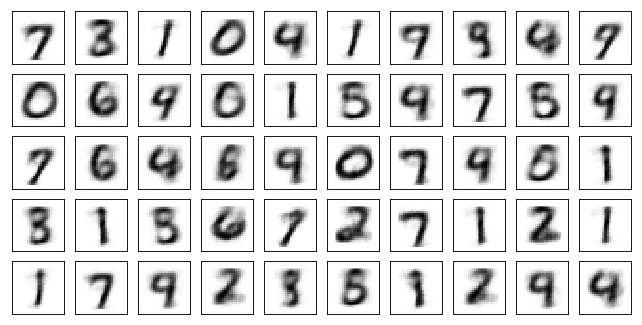

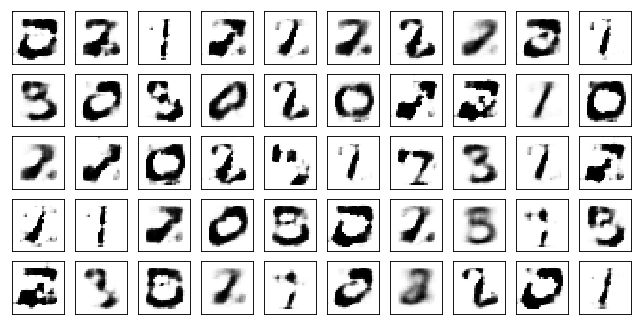

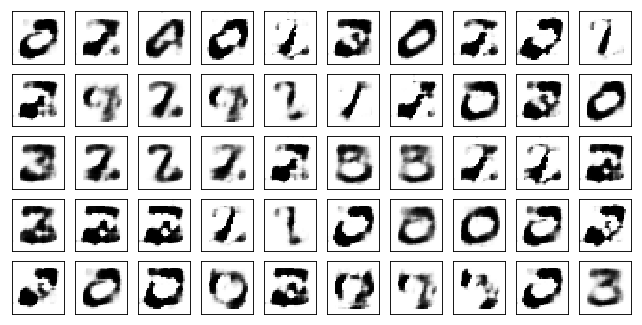

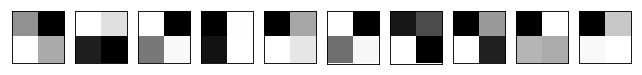

Model Adam Discr+bn+dp:


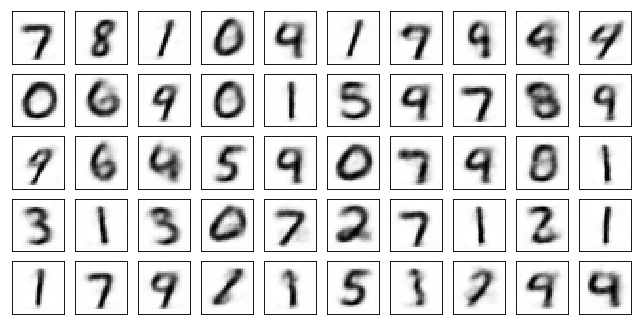

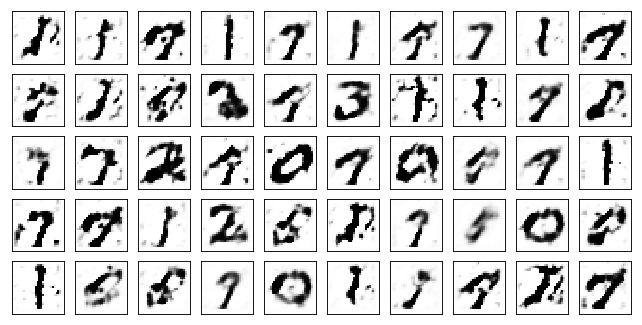

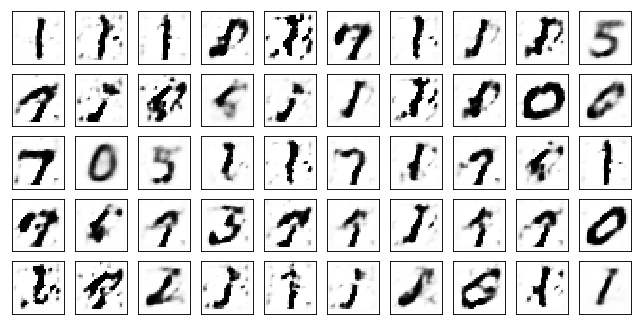

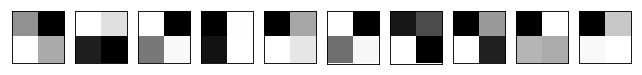

Test losses: 
Adam Discr+bn: 0.76894474 / 2.06715536 / 0.24219764 
Adam Discr+dp: 0.84610236 / 2.07832718 / 0.25603464 
Adam Discr+bn+dp: 0.74379891 / 2.08659601 / 0.24014967 

Train Epoch: 111 [0/50000 (0%)]	Losses Adam Discr+bn: AE:0.5582 D:0.0518 Adam Discr+dp: AE:0.5985 D:0.0497 Adam Discr+bn+dp: AE:0.5597 D:0.0541
Train Epoch: 111 [25000/50000 (50%)]	Losses Adam Discr+bn: AE:0.5488 D:0.0619 Adam Discr+dp: AE:0.6202 D:0.0545 Adam Discr+bn+dp: AE:0.5723 D:0.0534
Train Epoch: 111 [50000/50000 (100%)]	Losses Adam Discr+bn: AE:0.5197 D:0.0639 Adam Discr+dp: AE:0.5675 D:0.0532 Adam Discr+bn+dp: AE:0.5652 D:0.0624
Test losses: 
Adam Discr+bn: 0.77505618 / 2.08957767 / 0.23266043 
Adam Discr+dp: 0.84545505 / 2.02556229 / 0.25296607 
Adam Discr+bn+dp: 0.74319541 / 2.10868406 / 0.25593661 

Train Epoch: 112 [0/50000 (0%)]	Losses Adam Discr+bn: AE:0.5566 D:0.0437 Adam Discr+dp: AE:0.5940 D:0.1791 Adam Discr+bn+dp: AE:0.5428 D:0.1026
Train Epoch: 112 [25000/50000 (50%)]	Losses Adam Discr+bn: 

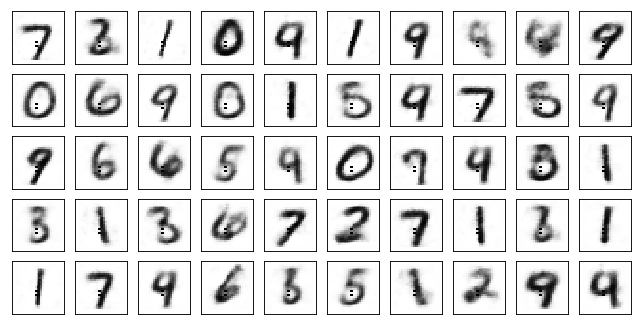

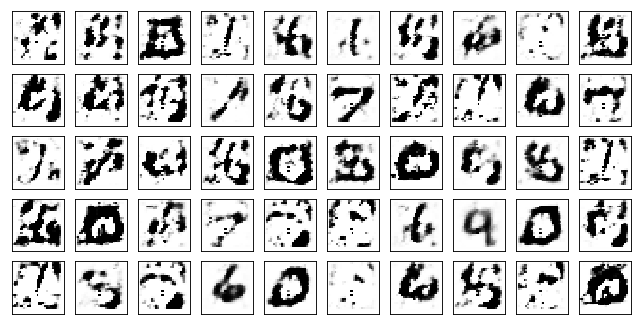

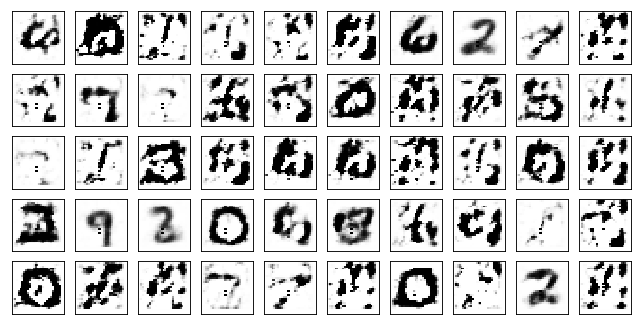

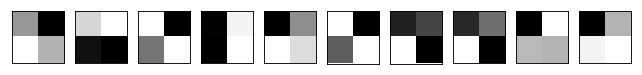

Model Adam Discr+dp:


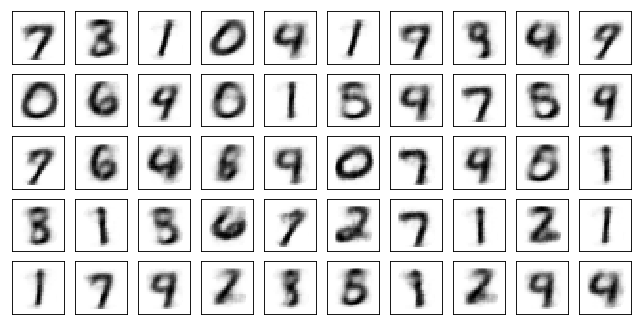

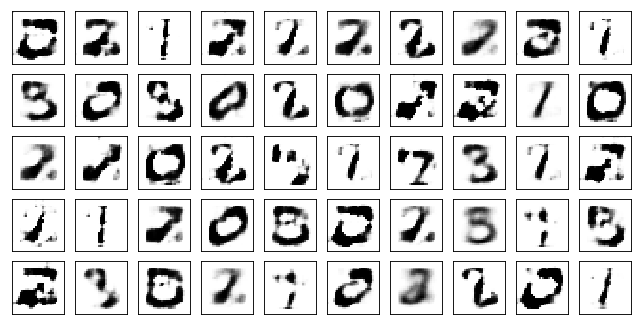

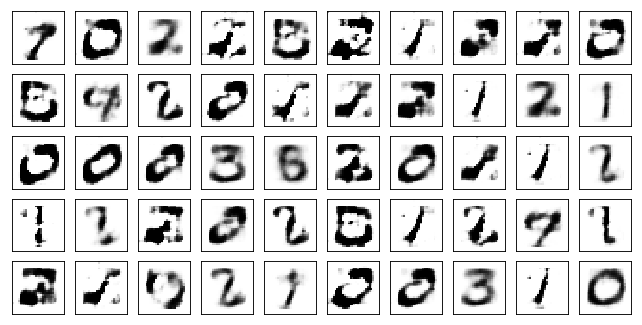

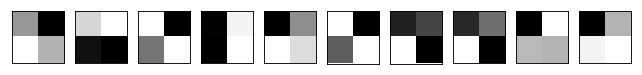

Model Adam Discr+bn+dp:


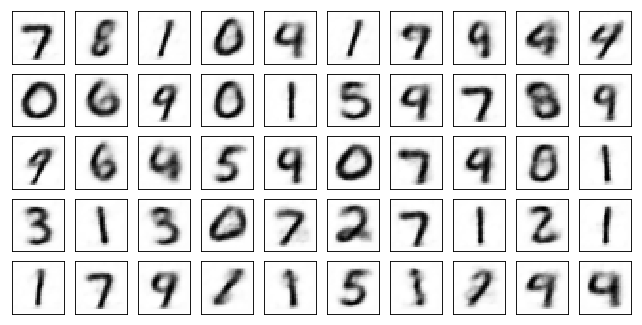

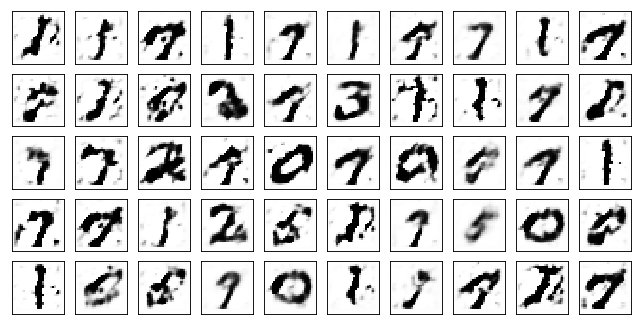

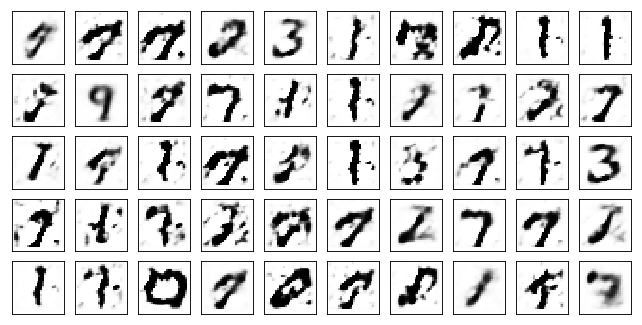

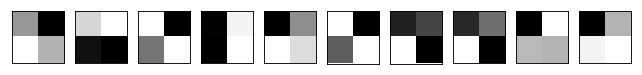

Test losses: 
Adam Discr+bn: 0.70668012 / 2.04742837 / 0.24553028 
Adam Discr+dp: 0.83569103 / 2.04095340 / 0.25663950 
Adam Discr+bn+dp: 0.73817563 / 2.17907119 / 0.24601940 

Train Epoch: 121 [0/50000 (0%)]	Losses Adam Discr+bn: AE:0.5328 D:0.0124 Adam Discr+dp: AE:0.5832 D:0.0133 Adam Discr+bn+dp: AE:0.5294 D:0.0182
Train Epoch: 121 [25000/50000 (50%)]	Losses Adam Discr+bn: AE:0.5360 D:0.0092 Adam Discr+dp: AE:0.5984 D:0.0472 Adam Discr+bn+dp: AE:0.5560 D:0.0771
Train Epoch: 121 [50000/50000 (100%)]	Losses Adam Discr+bn: AE:0.5653 D:0.0243 Adam Discr+dp: AE:0.5906 D:0.0113 Adam Discr+bn+dp: AE:0.5632 D:0.0551
Test losses: 
Adam Discr+bn: 0.70994657 / 2.10190129 / 0.24795671 
Adam Discr+dp: 0.83478481 / 2.05947471 / 0.24116720 
Adam Discr+bn+dp: 0.73779356 / 2.12972307 / 0.24761038 

Train Epoch: 122 [0/50000 (0%)]	Losses Adam Discr+bn: AE:0.5559 D:0.0528 Adam Discr+dp: AE:0.6581 D:0.0104 Adam Discr+bn+dp: AE:0.6436 D:0.0120
Train Epoch: 122 [25000/50000 (50%)]	Losses Adam Discr+bn: 

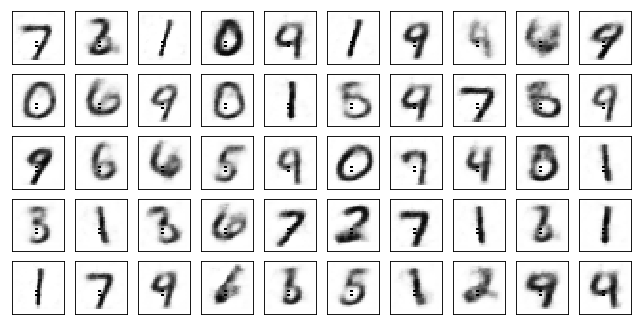

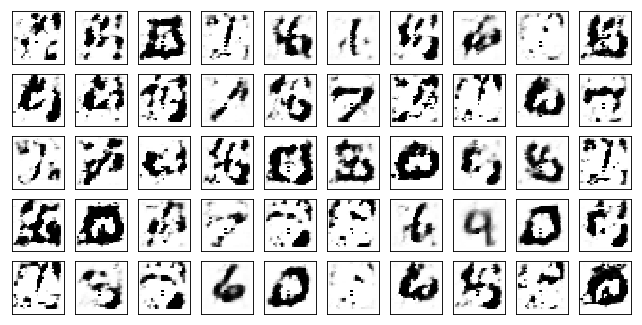

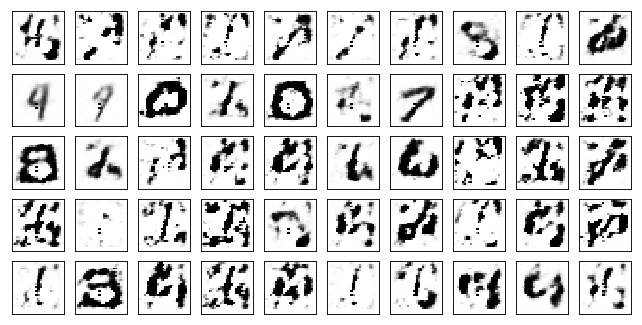

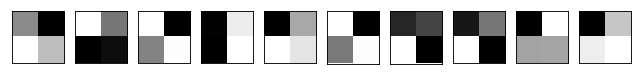

Model Adam Discr+dp:


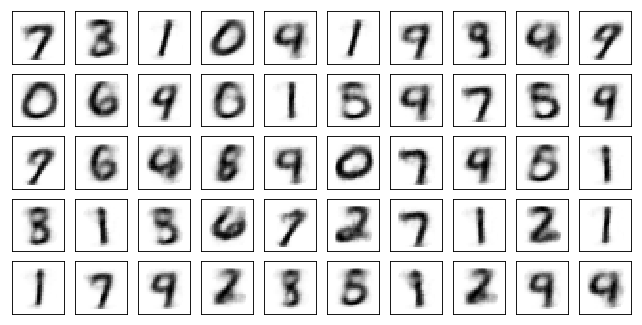

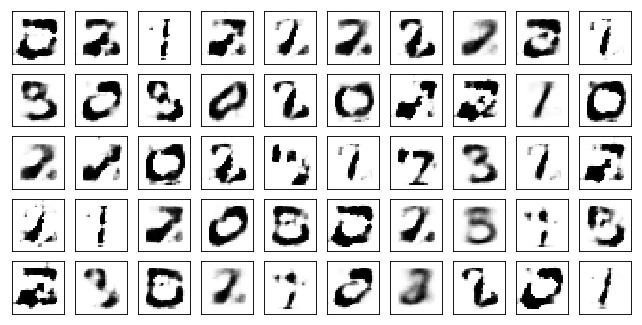

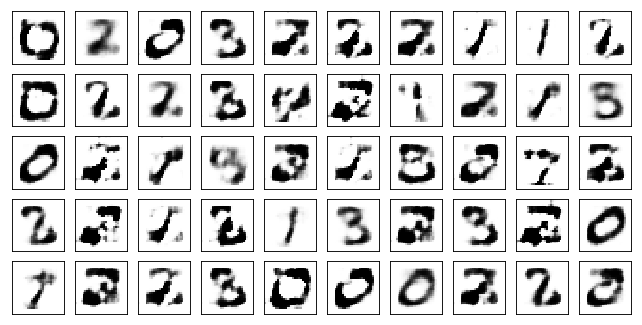

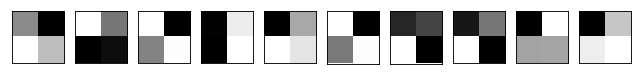

Model Adam Discr+bn+dp:


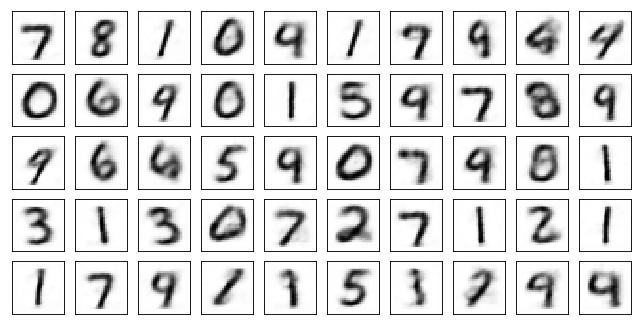

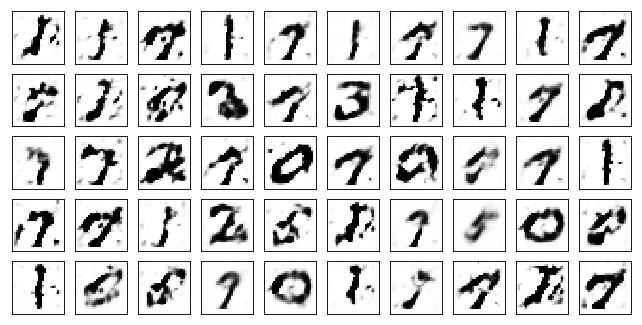

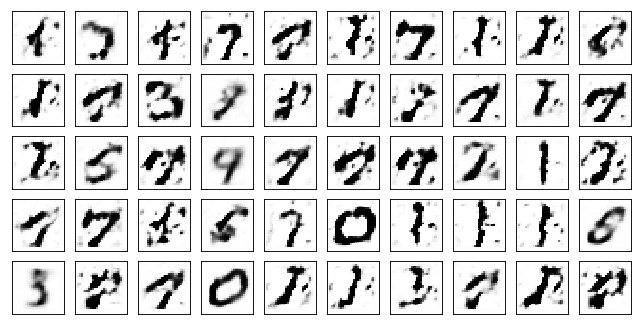

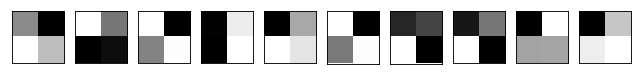

Test losses: 
Adam Discr+bn: 0.70191771 / 2.07898116 / 0.23516470 
Adam Discr+dp: 0.82795143 / 2.06599426 / 0.24662549 
Adam Discr+bn+dp: 0.73555237 / 2.14003968 / 0.24383099 

Train Epoch: 131 [0/50000 (0%)]	Losses Adam Discr+bn: AE:0.5306 D:0.0604 Adam Discr+dp: AE:0.5839 D:0.0137 Adam Discr+bn+dp: AE:0.5690 D:0.0128
Train Epoch: 131 [25000/50000 (50%)]	Losses Adam Discr+bn: AE:0.5590 D:0.1453 Adam Discr+dp: AE:0.5617 D:0.0140 Adam Discr+bn+dp: AE:0.5740 D:0.1494
Train Epoch: 131 [50000/50000 (100%)]	Losses Adam Discr+bn: AE:0.5420 D:0.0727 Adam Discr+dp: AE:0.5872 D:0.0109 Adam Discr+bn+dp: AE:0.5606 D:0.0848
Test losses: 
Adam Discr+bn: 0.69499975 / 2.13640475 / 0.23587051 
Adam Discr+dp: 0.82727635 / 1.98893523 / 0.24253551 
Adam Discr+bn+dp: 0.73520070 / 2.10776186 / 0.24564438 

Train Epoch: 132 [0/50000 (0%)]	Losses Adam Discr+bn: AE:0.5271 D:0.0136 Adam Discr+dp: AE:0.5877 D:0.0825 Adam Discr+bn+dp: AE:0.5558 D:0.0176
Train Epoch: 132 [25000/50000 (50%)]	Losses Adam Discr+bn: 

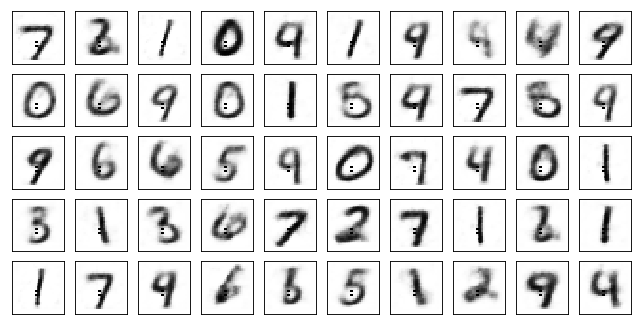

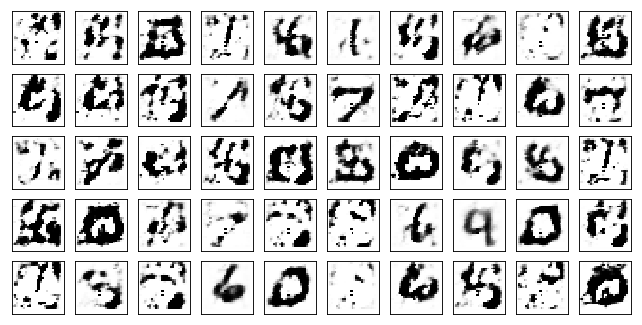

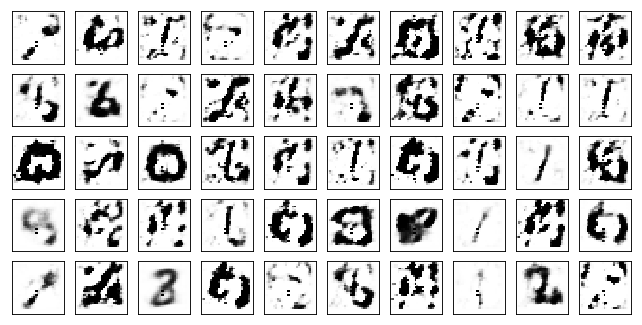

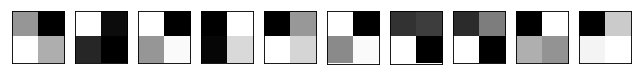

Model Adam Discr+dp:


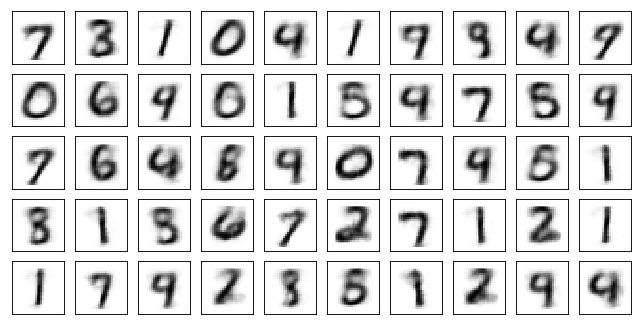

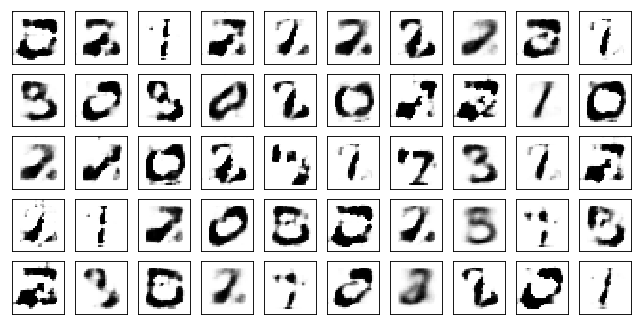

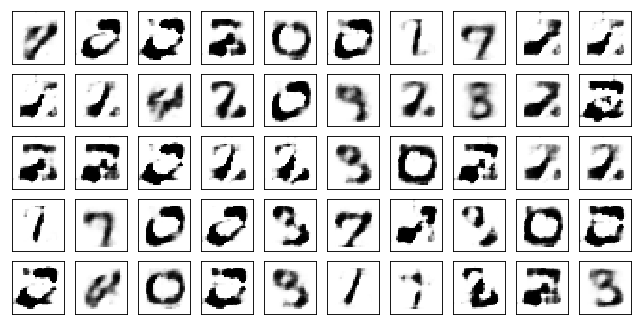

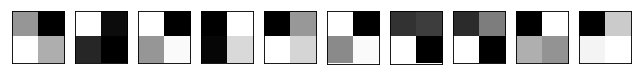

Model Adam Discr+bn+dp:


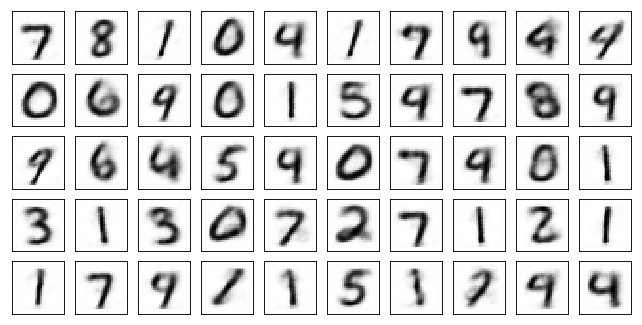

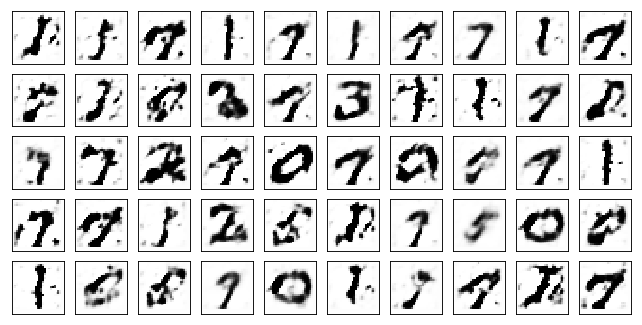

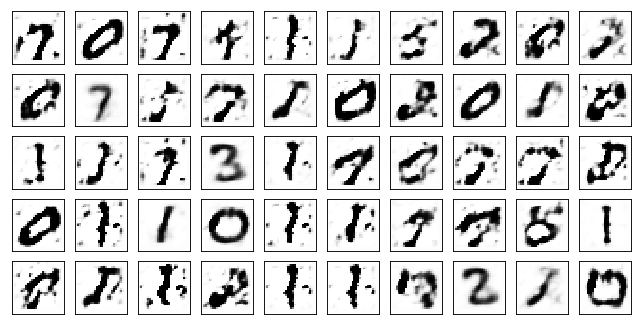

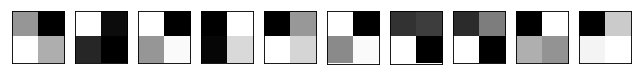

Test losses: 
Adam Discr+bn: 0.69147933 / 2.17003870 / 0.23825831 
Adam Discr+dp: 0.82236874 / 1.99196458 / 0.23063035 
Adam Discr+bn+dp: 0.73228127 / 2.29445553 / 0.26310891 

Train Epoch: 141 [0/50000 (0%)]	Losses Adam Discr+bn: AE:0.5470 D:0.0924 Adam Discr+dp: AE:0.5884 D:0.0399 Adam Discr+bn+dp: AE:0.5916 D:0.1040
Train Epoch: 141 [25000/50000 (50%)]	Losses Adam Discr+bn: AE:0.5371 D:0.1469 Adam Discr+dp: AE:0.5879 D:0.0145 Adam Discr+bn+dp: AE:0.5793 D:0.0595
Train Epoch: 141 [50000/50000 (100%)]	Losses Adam Discr+bn: AE:0.5630 D:0.0106 Adam Discr+dp: AE:0.5884 D:0.0651 Adam Discr+bn+dp: AE:0.5457 D:0.0708
Test losses: 
Adam Discr+bn: 0.68889385 / 2.19688797 / 0.24424507 
Adam Discr+dp: 0.82072681 / 2.00251102 / 0.25146963 
Adam Discr+bn+dp: 0.73187262 / 2.07350302 / 0.23788017 

Train Epoch: 142 [0/50000 (0%)]	Losses Adam Discr+bn: AE:0.5652 D:0.0604 Adam Discr+dp: AE:0.5583 D:0.0153 Adam Discr+bn+dp: AE:0.5626 D:0.0590
Train Epoch: 142 [25000/50000 (50%)]	Losses Adam Discr+bn: 

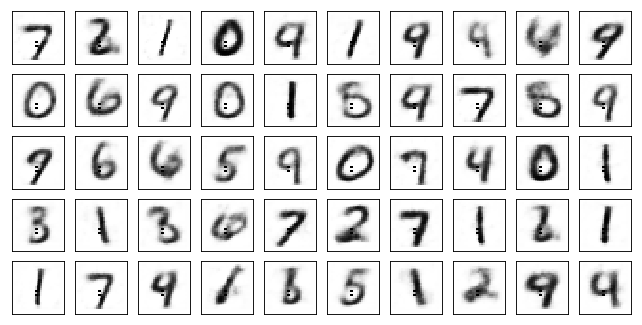

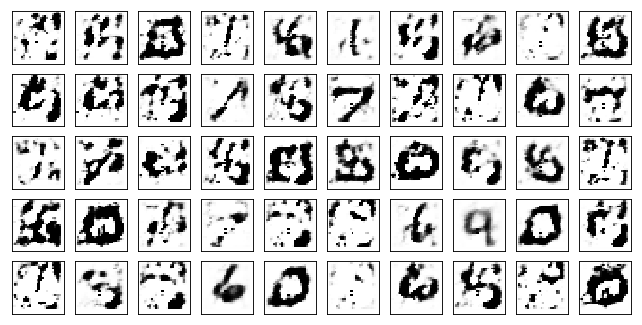

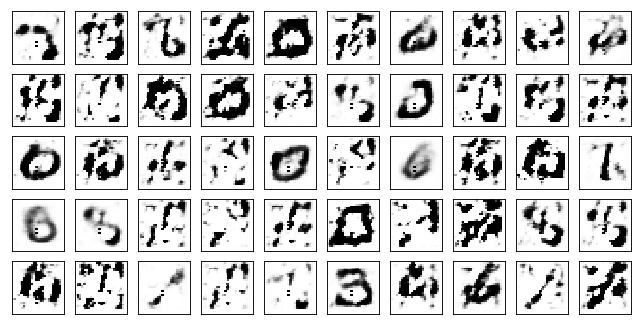

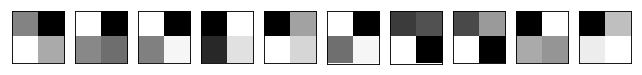

Model Adam Discr+dp:


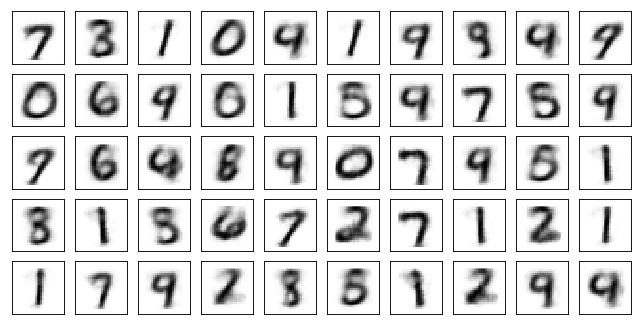

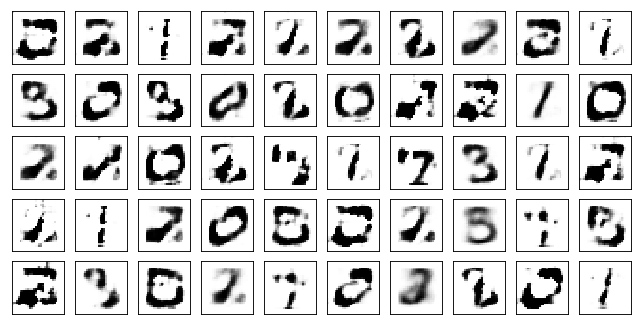

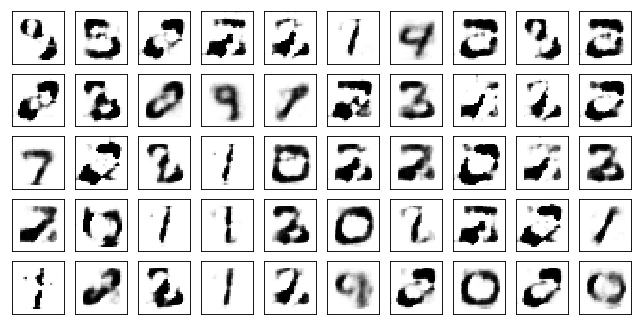

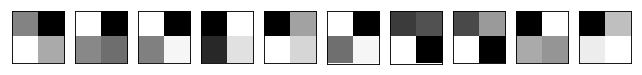

Model Adam Discr+bn+dp:


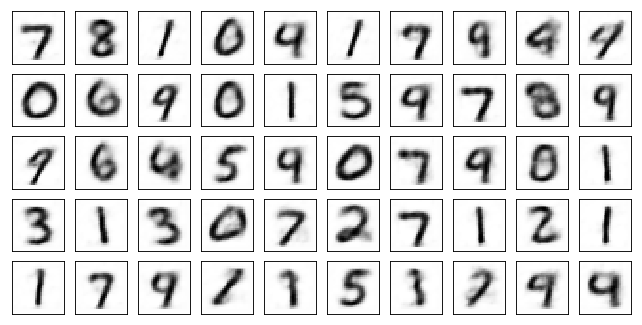

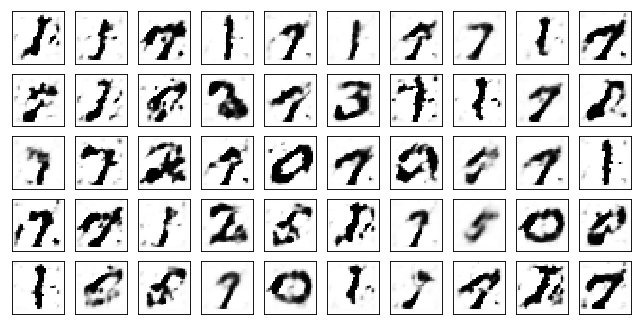

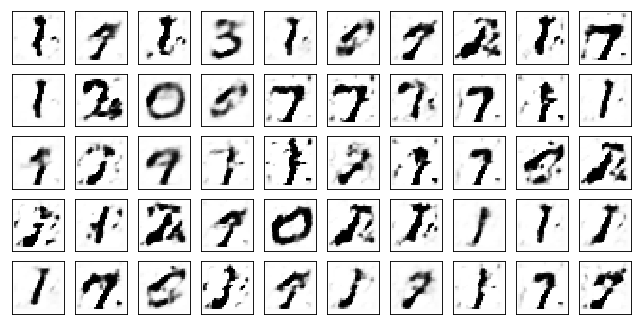

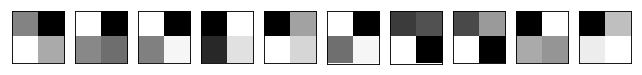

Test losses: 
Adam Discr+bn: 0.69075966 / 2.20510626 / 0.23642973 
Adam Discr+dp: 0.81646383 / 2.02652574 / 0.25184138 
Adam Discr+bn+dp: 0.73038864 / 2.25869298 / 0.24219145 

Train Epoch: 151 [0/50000 (0%)]	Losses Adam Discr+bn: AE:0.5284 D:0.0341 Adam Discr+dp: AE:0.5970 D:0.0498 Adam Discr+bn+dp: AE:0.5744 D:0.0797
Train Epoch: 151 [25000/50000 (50%)]	Losses Adam Discr+bn: AE:0.5222 D:0.0652 Adam Discr+dp: AE:0.5941 D:0.0093 Adam Discr+bn+dp: AE:0.5643 D:0.0607
Train Epoch: 151 [50000/50000 (100%)]	Losses Adam Discr+bn: AE:0.5568 D:0.0772 Adam Discr+dp: AE:0.5997 D:0.0929 Adam Discr+bn+dp: AE:0.5788 D:0.0118
Test losses: 
Adam Discr+bn: 0.69130927 / 2.16288543 / 0.24225855 
Adam Discr+dp: 0.81452113 / 1.96762764 / 0.23011680 
Adam Discr+bn+dp: 0.72906673 / 2.08578110 / 0.22995033 

Train Epoch: 152 [0/50000 (0%)]	Losses Adam Discr+bn: AE:0.5359 D:0.0731 Adam Discr+dp: AE:0.5745 D:0.1110 Adam Discr+bn+dp: AE:0.5484 D:0.1420
Train Epoch: 152 [25000/50000 (50%)]	Losses Adam Discr+bn: 

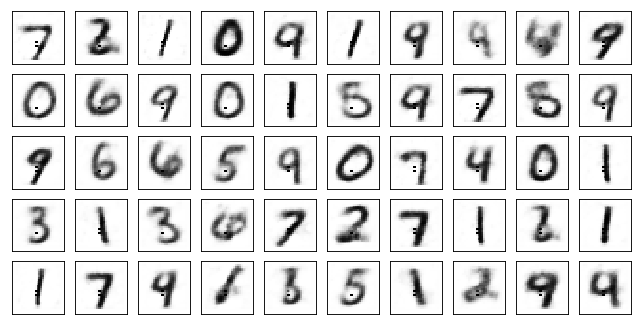

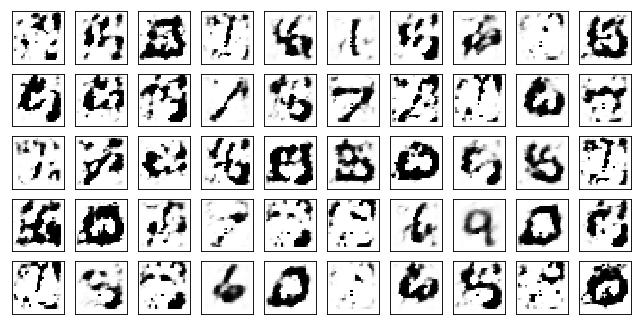

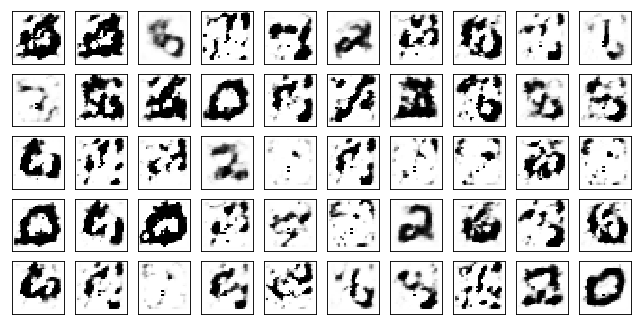

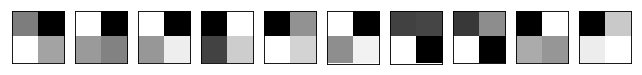

Model Adam Discr+dp:


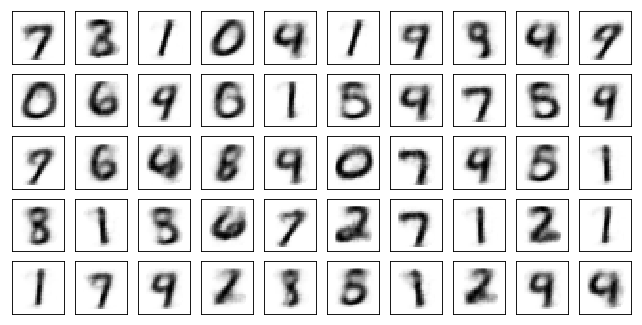

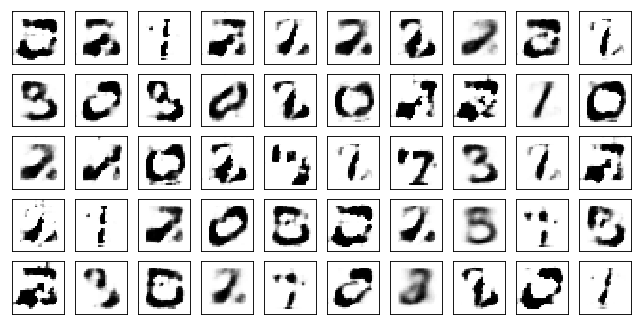

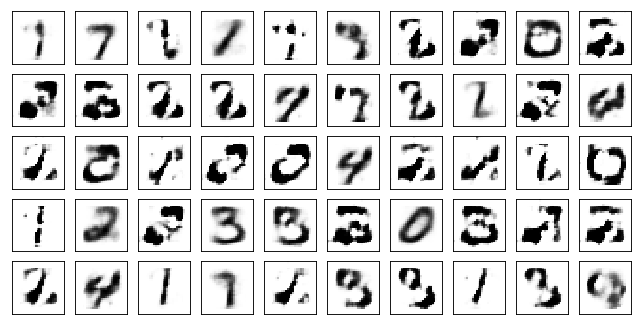

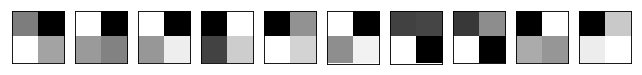

Model Adam Discr+bn+dp:


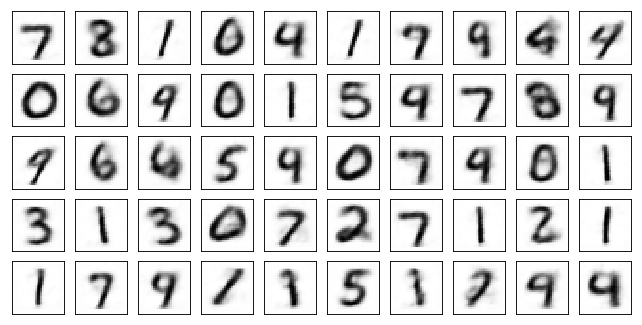

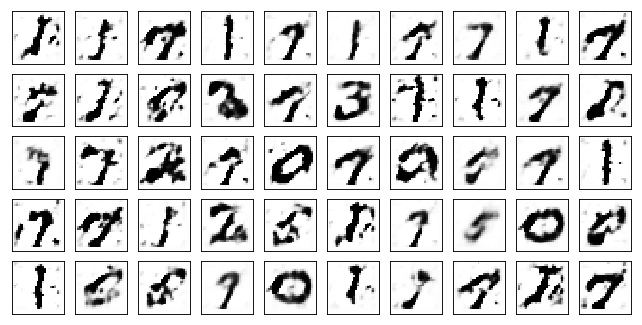

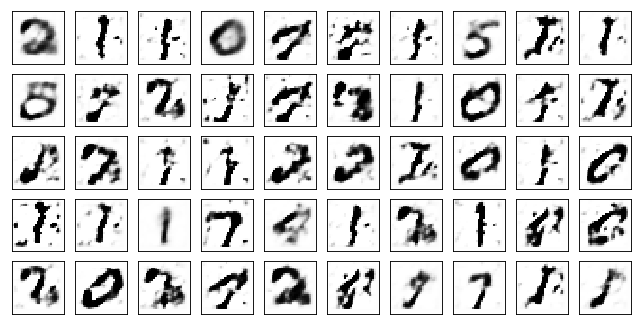

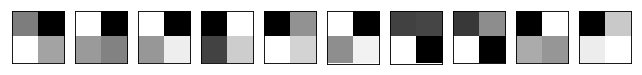

Test losses: 
Adam Discr+bn: 0.67266637 / 2.12420106 / 0.23499647 
Adam Discr+dp: 0.81336266 / 2.05982971 / 0.23497645 
Adam Discr+bn+dp: 0.72548163 / 2.20495391 / 0.25154670 

Train Epoch: 161 [0/50000 (0%)]	Losses Adam Discr+bn: AE:0.5398 D:0.0899 Adam Discr+dp: AE:0.6063 D:0.0718 Adam Discr+bn+dp: AE:0.5871 D:0.1663
Train Epoch: 161 [25000/50000 (50%)]	Losses Adam Discr+bn: AE:0.5601 D:0.1065 Adam Discr+dp: AE:0.5856 D:0.0106 Adam Discr+bn+dp: AE:0.5666 D:0.1513
Train Epoch: 161 [50000/50000 (100%)]	Losses Adam Discr+bn: AE:0.5685 D:0.0523 Adam Discr+dp: AE:0.6156 D:0.0967 Adam Discr+bn+dp: AE:0.5784 D:0.0416
Test losses: 
Adam Discr+bn: 0.66147155 / 2.15350080 / 0.24620284 
Adam Discr+dp: 0.81213653 / 2.10861897 / 0.24805017 
Adam Discr+bn+dp: 0.72473419 / 2.17456913 / 0.23852743 

Train Epoch: 162 [0/50000 (0%)]	Losses Adam Discr+bn: AE:0.5319 D:0.1408 Adam Discr+dp: AE:0.6038 D:0.1053 Adam Discr+bn+dp: AE:0.5651 D:0.0548
Train Epoch: 162 [25000/50000 (50%)]	Losses Adam Discr+bn: 

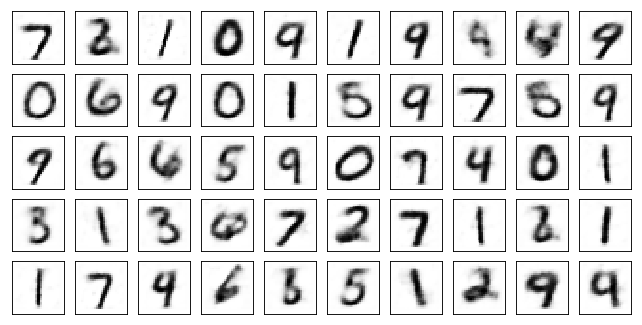

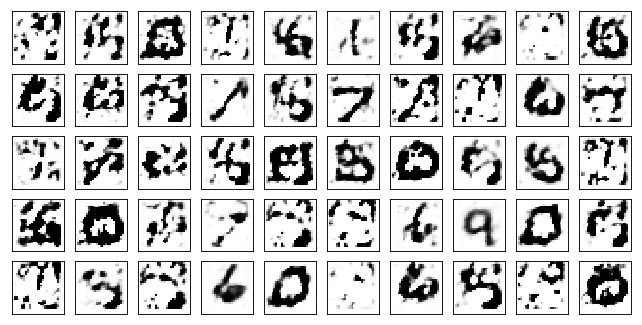

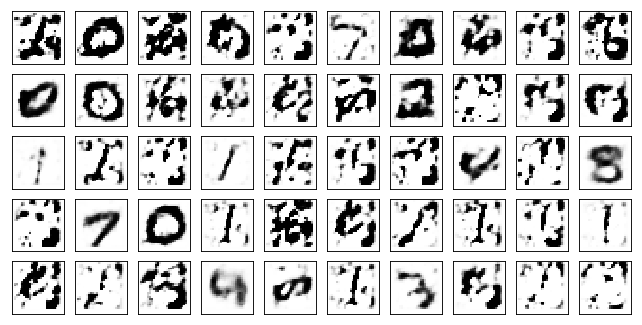

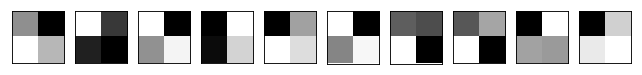

Model Adam Discr+dp:


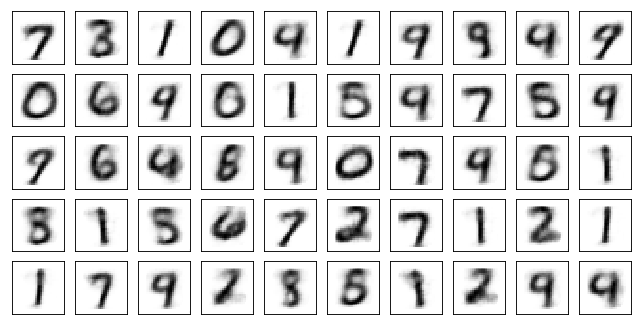

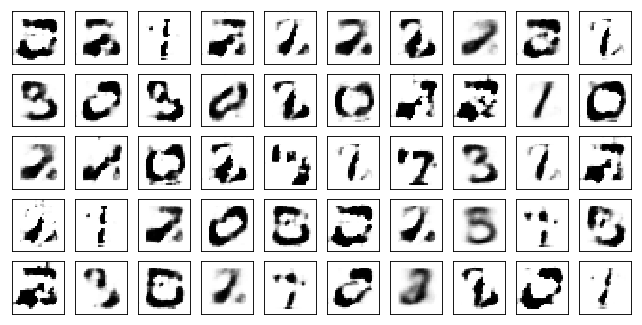

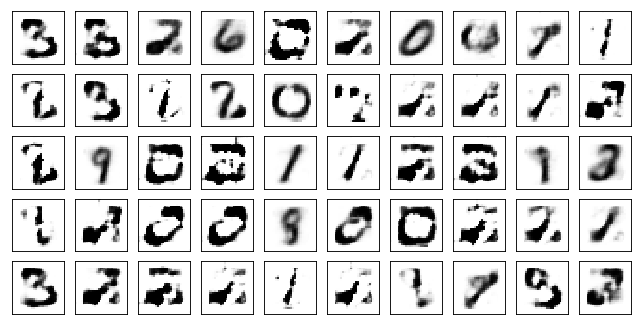

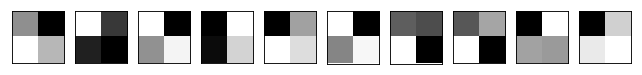

Model Adam Discr+bn+dp:


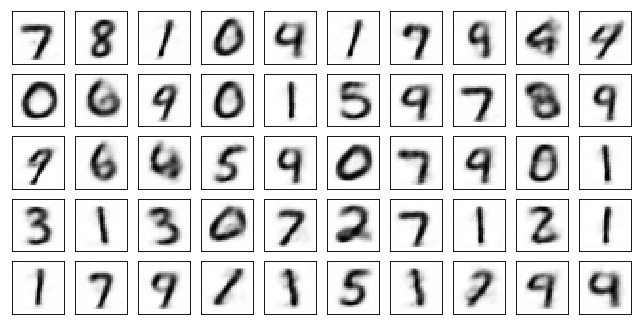

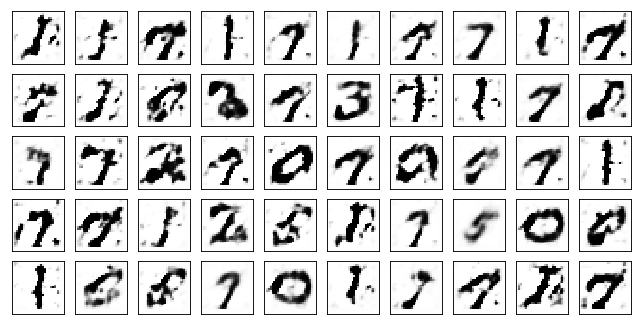

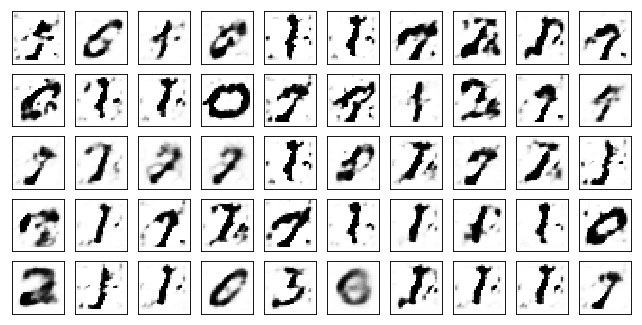

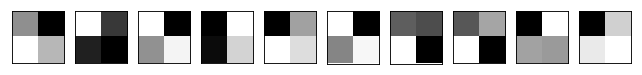

Test losses: 
Adam Discr+bn: 0.63470495 / 2.14670157 / 0.23325128 
Adam Discr+dp: 0.80917907 / 2.00627065 / 0.23579245 
Adam Discr+bn+dp: 0.72240973 / 2.17208385 / 0.23305365 

Train Epoch: 171 [0/50000 (0%)]	Losses Adam Discr+bn: AE:0.5400 D:0.0830 Adam Discr+dp: AE:0.5681 D:0.1312 Adam Discr+bn+dp: AE:0.5704 D:0.0630
Train Epoch: 171 [25000/50000 (50%)]	Losses Adam Discr+bn: AE:0.5425 D:0.0127 Adam Discr+dp: AE:0.6105 D:0.0768 Adam Discr+bn+dp: AE:0.5967 D:0.0506
Train Epoch: 171 [50000/50000 (100%)]	Losses Adam Discr+bn: AE:0.5223 D:0.0339 Adam Discr+dp: AE:0.6089 D:0.1094 Adam Discr+bn+dp: AE:0.5285 D:0.1179
Test losses: 
Adam Discr+bn: 0.63884687 / 2.13747907 / 0.23395091 
Adam Discr+dp: 0.80838102 / 2.05006790 / 0.24688004 
Adam Discr+bn+dp: 0.72085869 / 2.09623885 / 0.23259268 

Train Epoch: 172 [0/50000 (0%)]	Losses Adam Discr+bn: AE:0.5277 D:0.0385 Adam Discr+dp: AE:0.5980 D:0.0141 Adam Discr+bn+dp: AE:0.5572 D:0.1474
Train Epoch: 172 [25000/50000 (50%)]	Losses Adam Discr+bn: 

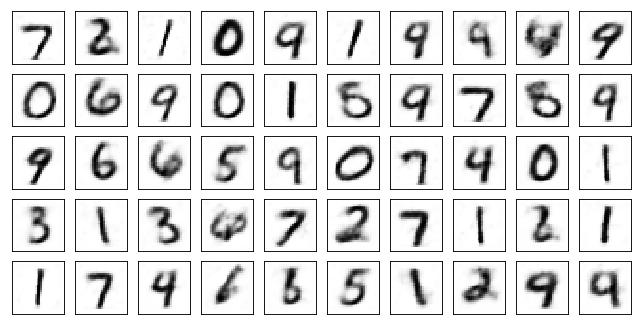

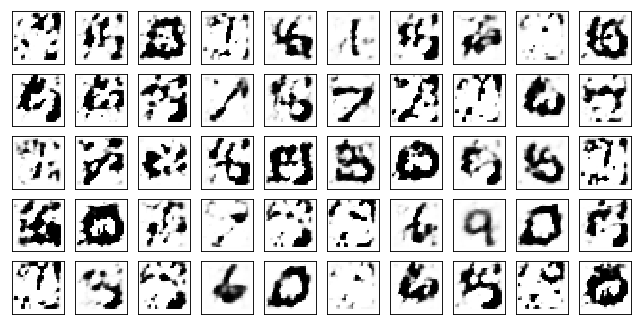

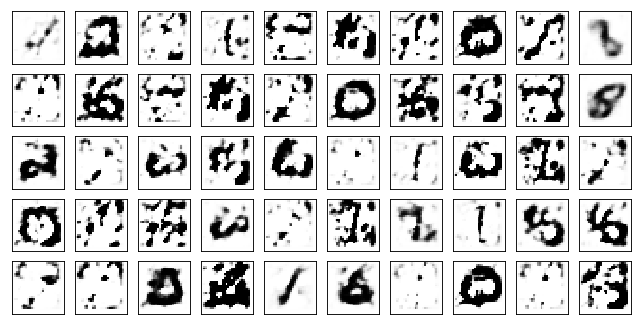

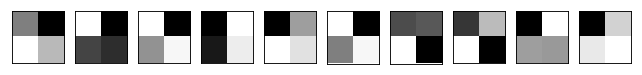

Model Adam Discr+dp:


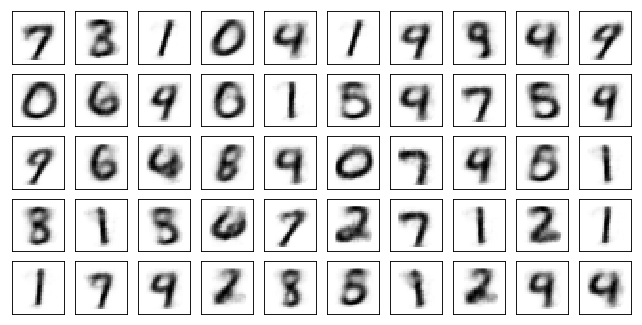

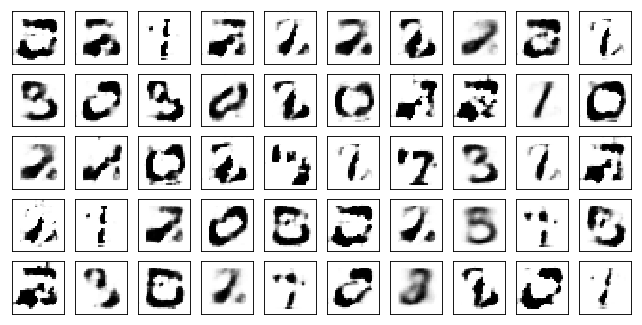

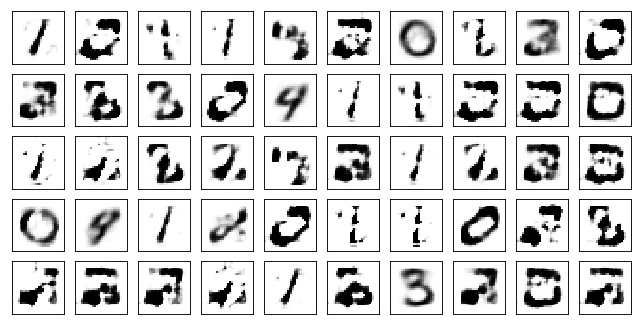

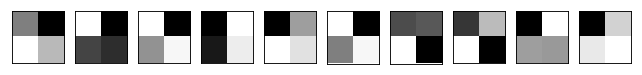

Model Adam Discr+bn+dp:


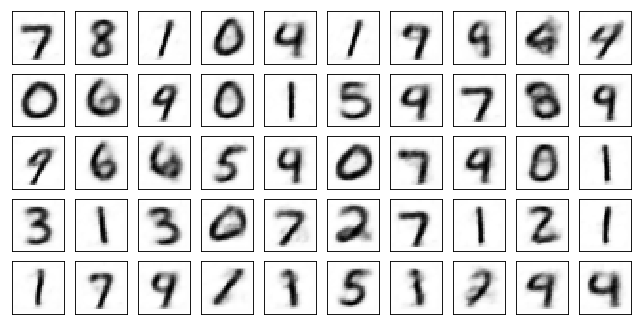

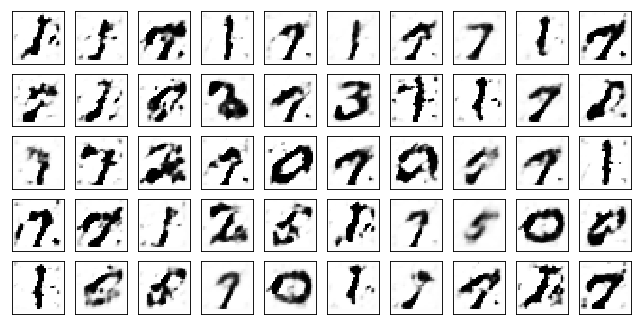

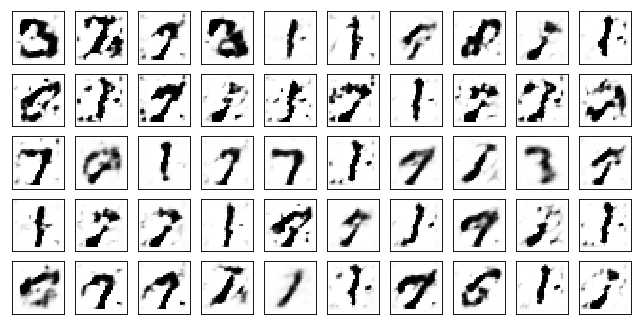

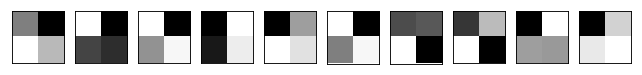

Test losses: 
Adam Discr+bn: 0.62720752 / 2.10191941 / 0.22868441 
Adam Discr+dp: 0.80620307 / 1.89822578 / 0.23013524 
Adam Discr+bn+dp: 0.71772474 / 2.26171708 / 0.23710917 

Train Epoch: 181 [0/50000 (0%)]	Losses Adam Discr+bn: AE:0.5308 D:0.0120 Adam Discr+dp: AE:0.5657 D:0.0446 Adam Discr+bn+dp: AE:0.5943 D:0.0087
Train Epoch: 181 [25000/50000 (50%)]	Losses Adam Discr+bn: AE:0.5477 D:0.1145 Adam Discr+dp: AE:0.6019 D:0.0092 Adam Discr+bn+dp: AE:0.5756 D:0.0707
Train Epoch: 181 [50000/50000 (100%)]	Losses Adam Discr+bn: AE:0.5262 D:0.0168 Adam Discr+dp: AE:0.6099 D:0.0320 Adam Discr+bn+dp: AE:0.5571 D:0.0592
Test losses: 
Adam Discr+bn: 0.62579900 / 2.13709641 / 0.22878165 
Adam Discr+dp: 0.80563086 / 2.04991865 / 0.25262705 
Adam Discr+bn+dp: 0.72271740 / 2.10708809 / 0.22549452 

Train Epoch: 182 [0/50000 (0%)]	Losses Adam Discr+bn: AE:0.5390 D:0.0652 Adam Discr+dp: AE:0.5918 D:0.0924 Adam Discr+bn+dp: AE:0.5715 D:0.0669
Train Epoch: 182 [25000/50000 (50%)]	Losses Adam Discr+bn: 

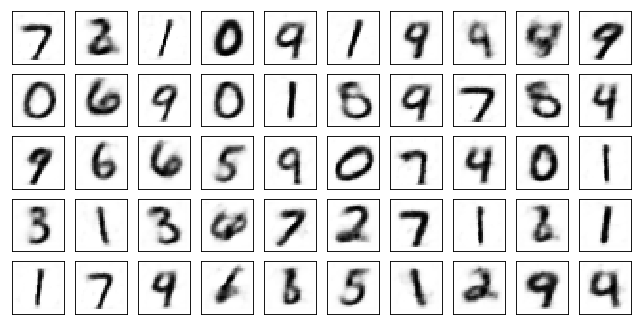

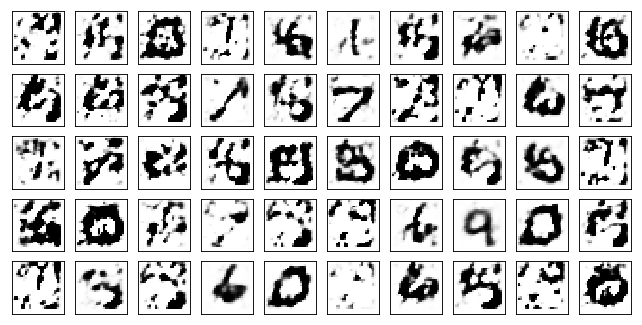

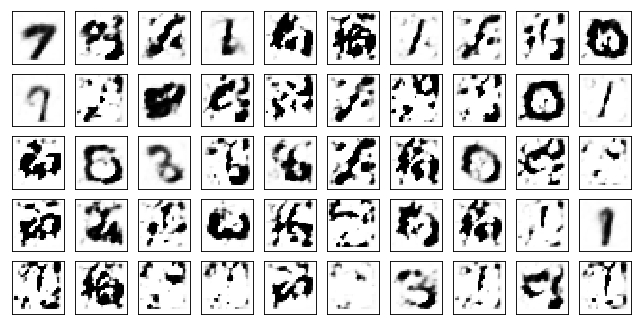

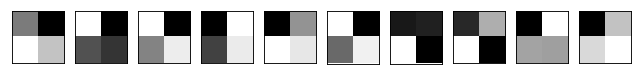

Model Adam Discr+dp:


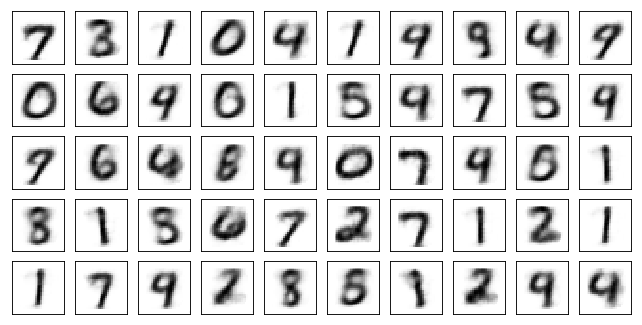

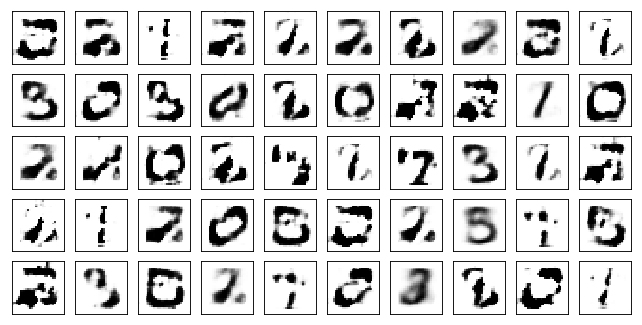

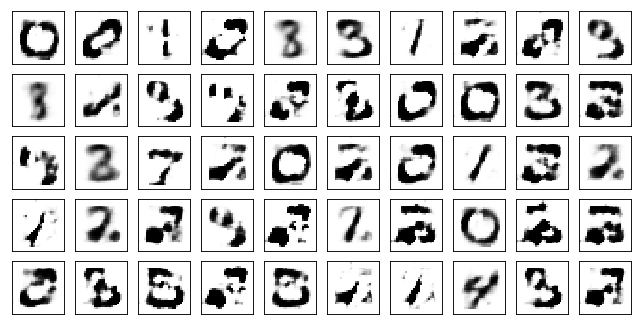

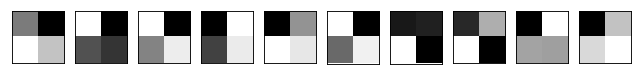

Model Adam Discr+bn+dp:


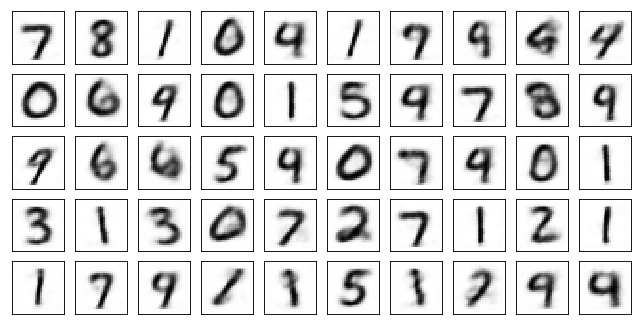

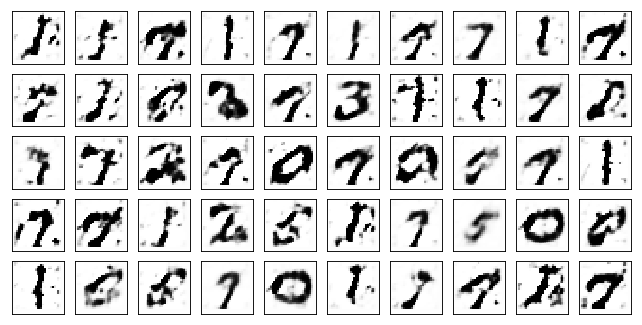

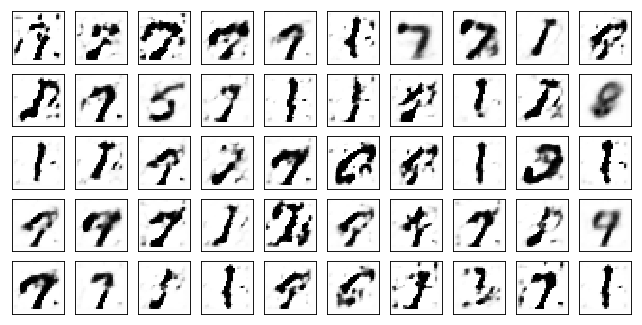

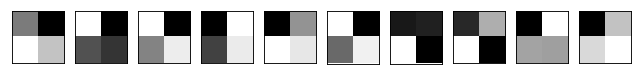

Test losses: 
Adam Discr+bn: 0.62843591 / 2.09629583 / 0.23103468 
Adam Discr+dp: 0.80820692 / 2.08686042 / 0.23630764 
Adam Discr+bn+dp: 0.71791899 / 2.16630197 / 0.22878625 

Train Epoch: 191 [0/50000 (0%)]	Losses Adam Discr+bn: AE:0.5326 D:0.1236 Adam Discr+dp: AE:0.5876 D:0.0445 Adam Discr+bn+dp: AE:0.5664 D:0.0273
Train Epoch: 191 [25000/50000 (50%)]	Losses Adam Discr+bn: AE:0.5697 D:0.0868 Adam Discr+dp: AE:0.5879 D:0.0470 Adam Discr+bn+dp: AE:0.5861 D:0.0503
Train Epoch: 191 [50000/50000 (100%)]	Losses Adam Discr+bn: AE:0.5240 D:0.0244 Adam Discr+dp: AE:0.5934 D:0.0765 Adam Discr+bn+dp: AE:0.5780 D:0.0357
Test losses: 
Adam Discr+bn: 0.62195992 / 2.17858434 / 0.22609480 
Adam Discr+dp: 0.80126059 / 1.99158800 / 0.23559147 
Adam Discr+bn+dp: 0.71657079 / 2.14561963 / 0.22459614 

Train Epoch: 192 [0/50000 (0%)]	Losses Adam Discr+bn: AE:0.5536 D:0.0613 Adam Discr+dp: AE:0.5813 D:0.0110 Adam Discr+bn+dp: AE:0.5733 D:0.0142
Train Epoch: 192 [25000/50000 (50%)]	Losses Adam Discr+bn: 

In [16]:
for epoch in range(1, train_epoch):
    for model in models.values():
        model.train()
    train(epoch, models, train_log)
    for model in models.values():
        model.eval()
    test(models, valid_loader, epoch, 10, test_log)

Model Adam Discr+bn:


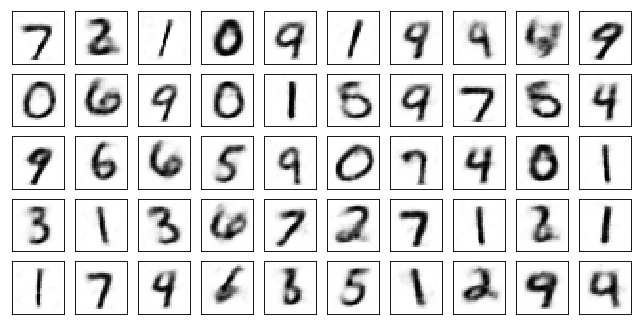

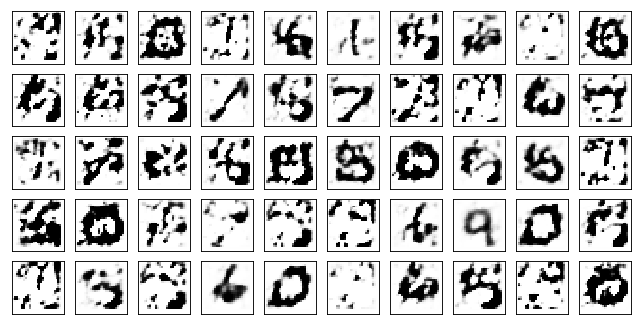

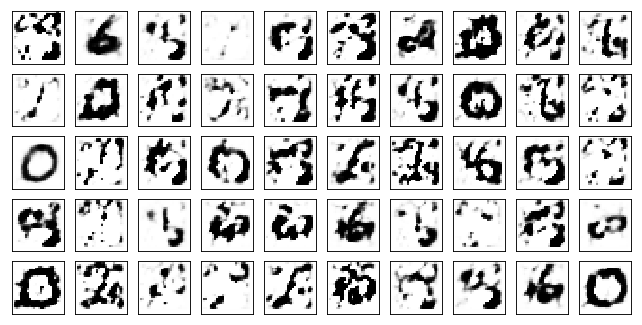

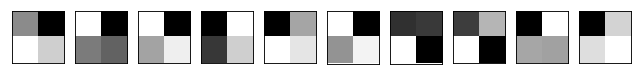

Model Adam Discr+dp:


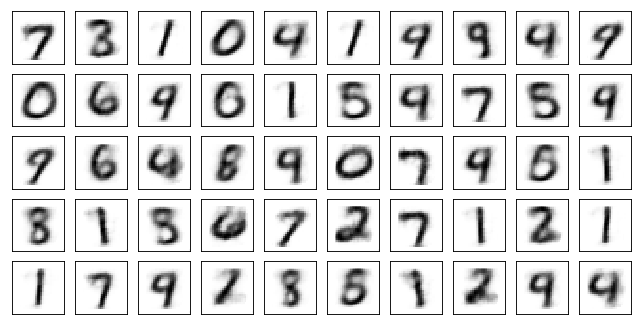

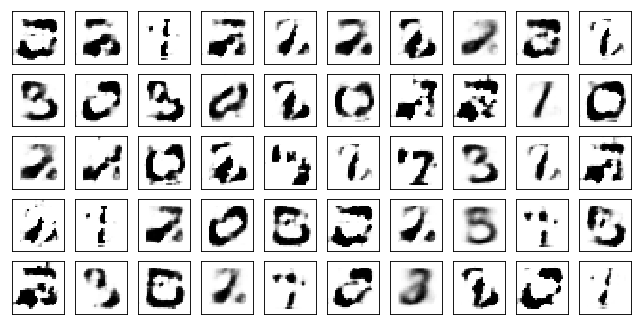

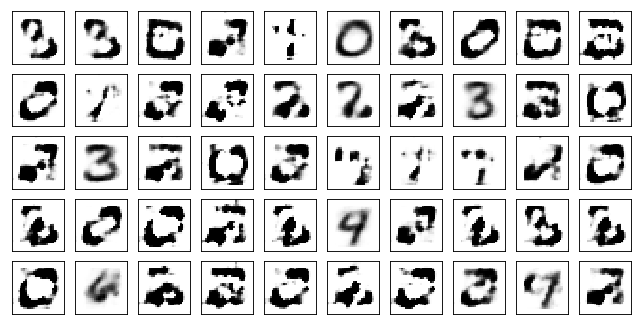

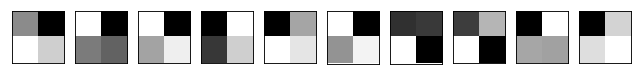

Model Adam Discr+bn+dp:


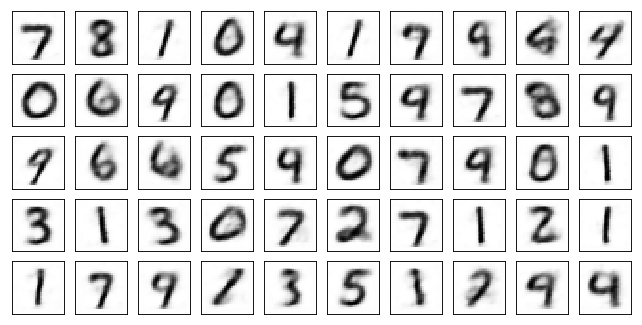

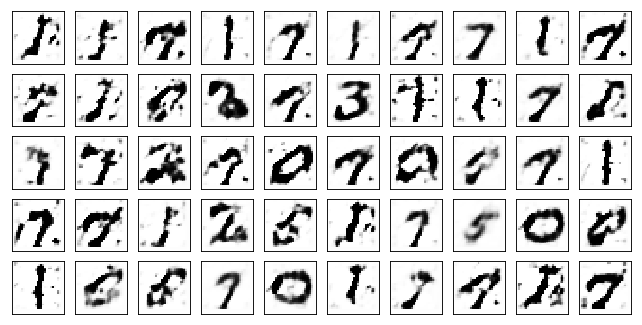

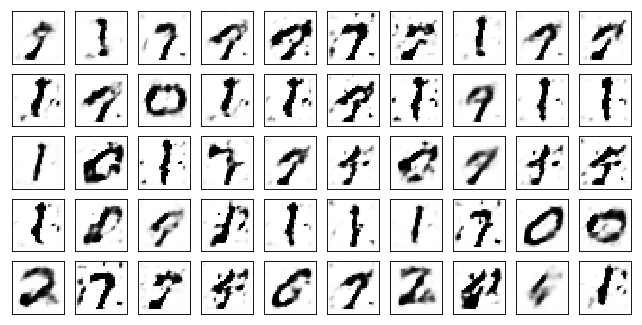

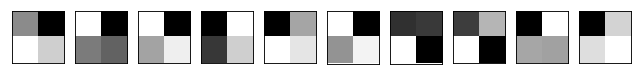

Test losses: 
Adam Discr+bn: 0.62290460 / 2.22230816 / 0.23420957 
Adam Discr+dp: 0.80398750 / 2.23126292 / 0.23603299 
Adam Discr+bn+dp: 0.71624196 / 2.16990161 / 0.23560870 



In [17]:
for model in models.values():
    model.eval()
test(models, valid_loader, 1, 1, test_log)

In [18]:
torch.save(models['Adam Discr+bn'], './adam_ds_bn_l4_1')
torch.save(models['Adam Discr+dp'], './adam_ds_dp_l4_1')
torch.save(models['Adam Discr+bn+dp'], './adam_ds_bndp_l4_1')

/home/aleksey/.conda/envs/otus-dl-engineer/lib/python3.6/site-packages/torch/serialization.py:241: UserWarning: Couldn't retrieve source code for container of type Net. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "
/home/aleksey/.conda/envs/otus-dl-engineer/lib/python3.6/site-packages/torch/serialization.py:241: UserWarning: Couldn't retrieve source code for container of type ConvLayer. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "
/home/aleksey/.conda/envs/otus-dl-engineer/lib/python3.6/site-packages/torch/serialization.py:241: UserWarning: Couldn't retrieve source code for container of type FullyConnected. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "
/home/aleksey/.conda/envs/otus-dl-engineer/lib/python3.6/site-packages/torch/serialization.py:241: UserWarning: Couldn't retrieve source code for container of type Deconv

### Вывод результатов

In [21]:
model = torch.load('./adam_ds_bndp_l4_1')

In [23]:
data, _ = next(iter(test_loader))
output = model(data)
to_plot = output.view(-1, 1, 28, 28).clamp(-1, 1).cpu().data.numpy()
with torch.no_grad():
    encoded = model.encode(data)
    enc_to_lot = encoded.view(-1, 1, 2, 2).clamp(-1, 1).cpu().data.numpy()
    print ('enc=', encoded.shape)


enc= torch.Size([50, 4])


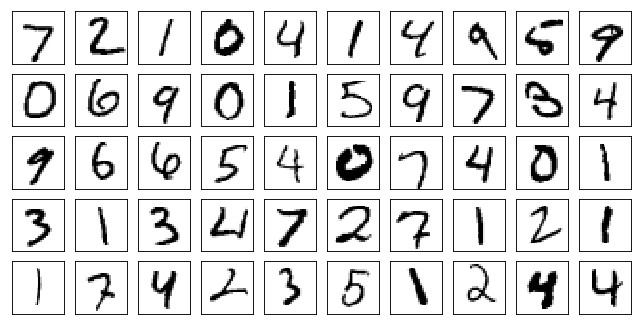

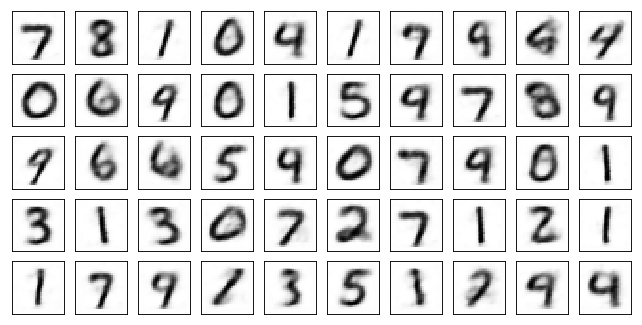

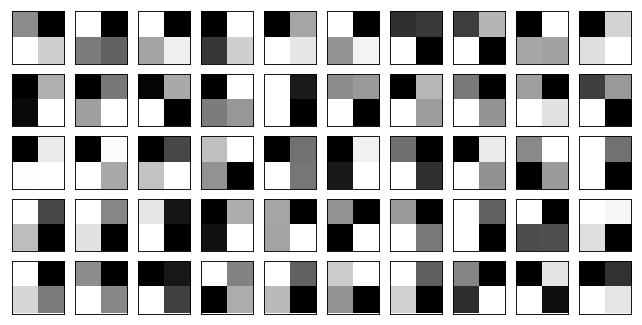

In [25]:
plot_mnist(data.data.cpu().numpy(), (5, 10))
plot_mnist(to_plot, (5, 10))
plot_latent(enc_to_lot, (5, 10))

In [28]:
def show_generated_samples():
    pred_z = torch.randn((50, 4)).to(device)
       
    pred_gen = model.decode(pred_z)
    generated = pred_gen.view(-1, 1, 28, 28).cpu().data.numpy()  
    plot_mnist(generated, (5, 10))

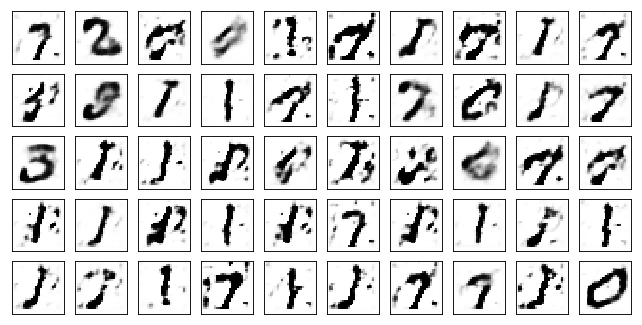

In [29]:
show_generated_samples()

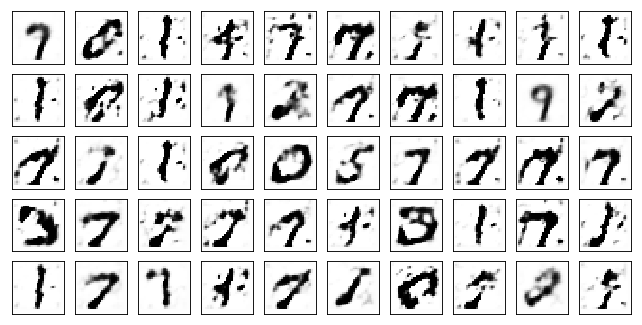

In [30]:
show_generated_samples()